# Testing script for 201736342 Wanderer

In [8]:
#from ipywidgets import interact, interactive, fixed, interact_manual
#import ipywidgets as widgets
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from astropy.io import fits
from glob import glob

from scipy.signal import convolve2d
from scipy.ndimage.filters import convolve
from scipy.interpolate import interp1d
from astropy.wcs import WCS
from tqdm import tnrange, tqdm_notebook
import warnings
warnings.filterwarnings("ignore",category = RuntimeWarning)
%matplotlib notebook

In [197]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
import numpy as np

from scipy.ndimage.filters import convolve
from scipy.interpolate import interp1d

from astropy.io import fits
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS

from astroquery.simbad import Simbad
from astroquery.ned import Ned
from astroquery.ned.core import RemoteServiceError
from xml.parsers.expat import ExpatError
from astroquery.exceptions import TableParseError
from astropy import coordinates
import astropy.units as u
import csv

from glob import glob
import os
import time as t

import warnings
warnings.filterwarnings("ignore",category = RuntimeWarning)
warnings.filterwarnings("ignore",category = UserWarning)



def DriftKiller(data,thrust):
    # The right value choice here is a bit ambiguous, though it seems that typical variations are <10.
    Drift = (abs(data[thrust+1]-data[thrust-1]) < 10)*1.0 
    Drift[Drift == 0] = np.nan
    j = 0
    for i in range(len(thrust)):
        data[j:thrust[i]] = data[j:thrust[i]]*Drift[i]
        j = thrust[i]
    return data

def FindMinFrame(data,thrusters):
    # Finding the reference frame
    Framemin = data[thrusters[3]+1]
    return Framemin

def ObjectMask(datacube,Framemin):
    # Make a mask of the target object, using the reference frame 
    Mask = datacube[Framemin,:,:]/(np.nanmedian(datacube[Framemin,:,:])+np.nanstd(datacube[Framemin,:,:]))
    Mask[Mask>=1] = np.nan
    Mask[Mask<1] = 1
    # Generate a second mask from remainder of the first. This grabs the fainter pixels around known sources
    Maskv2 = datacube[Framemin,:,:]*Mask/(np.nanmedian(datacube[Framemin,:,:]*Mask)+np.nanstd(datacube[Framemin,:,:]*Mask))
    Maskv2[Maskv2>=1] = np.nan
    Maskv2[Maskv2<1] = 1
    return Maskv2

def ThrustObjectMask(data,thrust):
    StartMask = np.ones((data.shape[1],data.shape[2]))
    for i in range(2):
        Start = data[thrust[:3]+1]*StartMask/(np.nanmedian(data[thrust[:3]+1]*StartMask, axis = (1,2))+np.nanstd(data[thrust[:3]+1]*StartMask, axis = (1,2)))[:,None,None]
        Start = Start >= 1
        temp = (np.nansum(Start*1, axis = 0) >=1)*1.0
        temp[temp>=1] = np.nan
        temp[temp<1] = 1
        StartMask = StartMask*temp


    EndMask = np.ones((data.shape[1],data.shape[2]))
    for i in range(2):
        End = data[thrust[-3:]+1]*EndMask/(np.nanmedian(data[thrust[-3:]+1]*EndMask, axis = (1,2))+np.nanstd(data[thrust[-3:]+1]*EndMask, axis = (1,2)))[:,None,None]
        End = End >= 1
        temp = (np.nansum(End*1, axis = 0) >=1)*1.0
        temp[temp>=1] = np.nan
        temp[temp<1] = 1
        EndMask = EndMask*temp
    
        
    Mask = np.nansum([np.ma.masked_invalid(StartMask).mask,np.ma.masked_invalid(EndMask).mask],axis=(0))*1.0
    Mask[Mask!=2] = 1
    Mask[Mask==2] = np.nan
    return Mask



def EventSplitter(events,Times,Masks,framemask):
    Events = []
    times = []
    mask = []
    for i in range(len(events)):
        # Check if there are multiple transients
        Coincident = Masks[events[i]]*framemask[events[i]]*1
        positions = np.where(Coincident == 1)
        if len(positions[0]) > 1:
            for p in range(len(positions[0])):
                eventmask = np.zeros((Masks.shape[1],Masks.shape[2]))
                eventmask[positions[0][p],positions[1][p]] = 1
                eventmask = convolve(eventmask,np.ones((3,3)),mode='constant', cval=0.0)
                Similar = np.where((Masks[Times[i][0]:,:,:]*eventmask == eventmask).all(axis=(1,2)))[0]
                
                if len((np.diff(Similar)<5)) > 1:
                    
                    if len(np.where((np.diff(Similar)<5) == False)[0]) > 0:
                        SimEnd = np.where((np.diff(Similar)<5) == False)[0][0] 
                    else:
                        SimEnd = -1
                else:
                    SimEnd = 0

                Similar = Similar[:SimEnd]
                if len(Similar) > 1:
                    timerange = [Similar[0]+Times[i][0]-1,Similar[-1]+Times[i][0]+1]
                    if len(timerange) > 1:
                        Events.append(events[i])
                        times.append(timerange)
                        mask.append(eventmask)
                
        else:
            Events.append(events[i])
            times.append(Times[i])
            mask.append(Masks[events[i]])
            

    return Events, times, mask

def Asteroid_fitter(Mask,Time,Data, plot = False):
    lc = np.nansum(Data*Mask,axis=(1,2))
    middle = np.where(np.nanmax(lc[Time[0]-1:Time[-1]+1]) == lc)[0][0]
    if abs(Time[0] - Time[1]) < 4:
        x = np.arange(middle-1,middle+1+1,1)
    else:
        x = np.arange(middle-2,middle+2+1,1)
    if x[-1] > len(lc) - 1:
        x = x[x<len(lc)]
    x2 = np.arange(0,len(x),1)
    if np.nanmedian(lc[x]) >0:
        y = lc[x]/np.nanmedian(lc[x])
        p1, residual, _, _, _ = np.polyfit(x,y,2, full = True)
        p2 = np.poly1d(p1)
        AvLeft = residual/len(x)#np.nansum(abs(lc[Time[0]:Time[-1]]/np.nanmedian(lc[x]) - p2(np.arange(Time[0],Time[-1]))))/(Time[-1]-Time[0])
        maxpoly = np.where(np.nanmax(p2(x)) == p2(x))[0][0]
        if (AvLeft < 10) &  (abs(middle - x[maxpoly]) < 2):
            asteroid = True
            if plot == True:
                p2 = np.poly1d(p1)
                plt.figure()
                plt.plot(x,y,'.',label='Event LC')
                plt.plot(x,p2(x),'kx',label='Parabola fit')
                plt.axvspan(Time[0],Time[1], color = 'orange',alpha=0.5, label = 'Event duration')
                plt.ylabel('Counts')
                plt.xlabel('Time')
                plt.legend()
                plt.title('Residual = ' + str(AvLeft))
                #plt.savefig('Asteroid_paper_example.pdf')
        else:
            asteroid = False
    else:
        asteroid = False

    return asteroid

def Smoothmax(interval,Lightcurve,qual):
    x = np.arange(interval[0],interval[1],1.)
    x[qual[interval[0]:interval[-1]]!=0] = np.nan 
    nbins = int(len(x)/5)
    y = np.copy(Lightcurve[interval[0]:interval[-1]])
    y[qual[interval[0]:interval[-1]]!=0] = np.nan
    
    if np.nansum(x) > 0:
        n, _ = np.histogram(x, bins=nbins,range=(np.nanmin(x),np.nanmax(x)))
        sy, _ = np.histogram(x, bins=nbins, weights=y,range=(np.nanmin(x),np.nanmax(x)))
        sy2, _ = np.histogram(x, bins=nbins, weights=y*y,range=(np.nanmin(x),np.nanmax(x)))
        mean = sy / n
        std = np.sqrt(sy2/n - mean*mean)

        xrange = np.linspace(np.nanmin(x),np.nanmax(x),len(x))
        y_smooth = np.interp(xrange, (_[1:] + _[:-1])/2, mean)
        y_smooh_error = np.interp(xrange, (_[1:] + _[:-1])/2, std)

        temp = np.copy(y)
        temp[y_smooh_error>10] =np.nan

        maxpos = np.where(temp == np.nanmax(temp))[0]+interval[0]
    else:
        maxpos = 0
    return maxpos

def ThrusterElim(Events,Times,Masks,Firings,Quality,qual,Data):
    temp = []
    temp2 = []
    temp3 = []
    asteroid = []
    asttime = []
    astmask = []
    for i in range(len(Events)):
        Range = Times[i][-1] - Times[i][0]
        if (Range > 0) & (Range/Data.shape[0] < 0.8) & (Times[i][0] > 5): 
            begining = Firings[(Firings >= Times[i][0]-2) & (Firings <= Times[i][0]+1)]
            if len(begining) == 0:
                begining = Quality[(Quality == Times[i][0])] #& (Quality <= Times[i][0]+1)]
            end = Firings[(Firings >= Times[i][-1]-1) & (Firings <= Times[i][-1]+2)]
            if len(end) == 0:
                end = Quality[(Quality == Times[i][-1])] #& (Quality <= Times[i][-1]+1)]
            eventthrust = Firings[(Firings >= Times[i][0]) & (Firings <= Times[i][-1])]

            if (~begining.any() & ~end.any()) & (Range < 48): # Change to the nominal cadences  for a day 
                
                if Asteroid_fitter(Masks[i],Times[i],Data):
                    asteroid.append(Events[i])
                    asttime.append(Times[i])
                    astmask.append(Masks[i])
                else:
                    LC = np.nansum(Data[Times[i][0]:Times[i][-1]+3]*Masks[i], axis = (1,2))
                    if (np.where(np.nanmax(LC) == LC)[0] < Range).all():
                    
                        temp.append(Events[i])
                        temp2.append(Times[i])
                        temp3.append(Masks[i])

            elif Range >= 48:

                if begining.shape[0] == 0:
                    begining = 0
                else:
                    begining = begining[0]   
                if end.shape[0] == 0:
                    end = Times[i][-1] + 10
                else:
                    end = end[0]
                LC = np.nansum(Data*Masks[i], axis = (1,2))
                maxloc = Smoothmax(Times[i],LC,qual)

                if ((maxloc > begining).all() & (maxloc < end)).all(): 
                    premean = np.nanmean(LC[eventthrust-1]) 
                    poststd = np.nanstd(LC[eventthrust+1])
                    postmean = np.nanmedian(LC[eventthrust+1])
                    Outsidethrust = Firings[(Firings < Times[i][0]) | (Firings > Times[i][-1]+20)]
                    Outsidemean = np.nanmedian(LC[Outsidethrust+1])
                    Outsidestd = np.nanstd(LC[Outsidethrust+1])
                    if  postmean > Outsidemean+2*Outsidestd:
                        temp.append(Events[i])
                        temp2.append(Times[i])
                        temp3.append(Masks[i])


    events = np.array(temp)
    eventtime = np.array(temp2)
    eventmask = np.array(temp3)
    return events, eventtime, eventmask, asteroid, asttime, astmask

def Asteroid_identifier(Events,Times,Masks,Firings,Quality,qual,Data):
    asteroid = []
    asttime = []
    astmask = []
    for i in range(len(Events)):
        Range = Times[i][-1] - Times[i][0]
        if (Range > 0) & (Range/Data.shape[0] < 0.8) & (Times[i][0] > 5): 
            begining = Firings[(Firings >= Times[i][0]-2) & (Firings <= Times[i][0]+1)]
            #if len(begining) == 0:
             #   begining = Quality[(Quality == Times[i][0])] #& (Quality <= Times[i][0]+1)]
            end = Firings[(Firings >= Times[i][-1]-1) & (Firings <= Times[i][-1]+2)]
            #if len(end) == 0:
             #   end = Quality[(Quality == Times[i][-1])] #& (Quality <= Times[i][-1]+1)]
            eventthrust = Firings[(Firings >= Times[i][0]) & (Firings <= Times[i][-1])]

            if (~begining.any() & ~end.any()) & (len(eventthrust) < 3):
                
                if Asteroid_fitter(Masks[i],Times[i],Data):
                    asteroid.append(Events[i])
                    asttime.append(Times[i])
                    astmask.append(Masks[i])
                
    return asteroid, asttime, astmask


def Match_events(Events,Eventtime,Eventmask):
    i = 0
    while i < len(Events):
        coincident = (((Eventtime[:,0] >= Eventtime[i,0]-3) & (Eventtime[:,0] <= Eventtime[i,0]+3)) | ((Eventtime[:,1] >= Eventtime[i,1]-3) & (Eventtime[:,1] <= Eventtime[i,1]+3))) & (np.nansum(convolve(Eventmask[i],np.ones((3,3)), mode = 'constant', cval=0.0)*Eventmask[:],axis=(1,2)) > 0)

        if sum(coincident*1) > 1:
            newmask = (np.nansum(Eventmask[coincident],axis = (0)) > 0)*1 

            Events = np.delete(Events,np.where(coincident)[0][1:])
            Eventtime = np.delete(Eventtime,np.where(coincident)[0][1:], axis = (0))
            Eventmask = np.delete(Eventmask,np.where(coincident)[0][1:], axis = (0))
            Eventmask[np.where(coincident)[0][0]] = newmask

        i +=1
        
    return Events, Eventtime,Eventmask

def Match_asteroids(Events,Eventtime,Eventmask):
    i = 0
    while i < len(Events):
        coincident = (((Eventtime[:,0] >= Eventtime[i,0]-3) & (Eventtime[:,0] <= Eventtime[i,0]+3)) | ((Eventtime[:,1] >= Eventtime[i,1]-3) & (Eventtime[:,1] <= Eventtime[i,1]+3))) & (np.nansum(convolve(Eventmask[i],np.ones((3,3)), mode = 'constant', cval=0.0)*Eventmask[:],axis=(1,2)) > 0)
        if sum(coincident*1) > 1:
            newmask = (np.nansum(Eventmask[coincident],axis = (0)) > 0)*1 

            Events = np.delete(Events,np.where(coincident)[0][1:])
            Eventtime = np.delete(Eventtime,np.where(coincident)[0][1:], axis = (0))
            Eventmask = np.delete(Eventmask,np.where(coincident)[0][1:], axis = (0))
            Eventmask[np.where(coincident)[0][0]] = newmask

        i +=1
        
    return Events, Eventtime,Eventmask

def Remove_asteroids(Asteroid,Asttime,Astmask,Maskdata):
    dataclean = np.copy(Maskdata)
    for i in range(len(Asteroid)):
        dataclean[Asttime[i][0]:Asttime[i][1],Astmask[i]==1] = np.nan
    return dataclean

def First_pass(Datacube,Qual,Quality,Thrusters,Pixelfile):
    #calculate the reference frame
    if len(Thrusters) > 4:
        Framemin = Thrusters[3]+1
    elif len(Thrusters) > 0:
        Framemin = Thrusters[0]+1
    else:
        Framemin = 100 # Arbitrarily chosen, Data is probably screwed anway if there are no thruster firings.
    # Apply object mask to data
    Mask = ThrustObjectMask(Datacube,Thrusters)

    Maskdata = Datacube*Mask

    # Make a mask for the object to use as a test to eliminate very bad pointings
    obj = np.ma.masked_invalid(Mask).mask
    objmed = np.nanmedian(Datacube[Thrusters+1]*obj,axis=(0))
    objstd = np.nanstd(Datacube[Thrusters+1]*obj,axis=(0))
    Maskdata[(np.nansum(Datacube*obj,axis=(1,2)) < np.nansum(objmed-1*objstd)),:,:] = np.nan

    framemask = np.zeros(Maskdata.shape)

    limit = abs(np.nanmedian(Maskdata[Qual == 0], axis = (0))+2*(np.nanstd(Maskdata[Qual == 0], axis = (0))))
    framemask = ((Maskdata/limit) >= 1)
    framemask[:,np.where(Maskdata > 100000)[1],np.where(Maskdata > 100000)[2]] = 0

    # Identify if there is a sequence of consecutive or near consecutive frames that meet condtition 


    Eventmask_ref = (convolve(framemask,np.ones((1,3,3)),mode='constant', cval=0.0))*1
    Eventmask = np.copy(Eventmask_ref)
    Eventmask[~np.where((convolve(Eventmask_ref,np.ones((5,1,1)),mode='constant', cval=0.0) >= 3))[0]] = 0
    Eventmask[Qual!=0,:,:] = False
    Eventmask_ref[Qual!=0,:,:] = False

    Index = np.where(np.nansum(Eventmask*1, axis = (1,2))>0)[0]

    events = []
    eventtime = []
    while len(Index) > 1:

        similar = np.where(((Eventmask[Index[0]]*Eventmask_ref[Index[0]:]) == Eventmask[Index[0]]).all(axis = (1,2)))[0]+Index[0]

        if len((np.diff(similar)<5)) > 1:

            if len(np.where((np.diff(similar)<5) == False)[0]) > 0:
                simEnd = np.where((np.diff(similar)<5) == False)[0][0] 
            else:
                simEnd = -1
        else:
            simEnd = 0
        if (simEnd > 0):
            similar = similar[:simEnd]
        elif (simEnd == 0):
            similar = np.array([similar[0]])

        if len(similar) > 1:

            events.append(similar[0])
            temp = [similar[0]-1,similar[-1]+1]
            eventtime.append(temp)
            temp = []
        template = Eventmask[Index[0]]
        for number in similar:
            if (np.nansum(template*1-Eventmask[number]*1) == 0):
                Index = np.delete(Index, np.where(Index == number)[0])

    events, eventtime, eventmask = EventSplitter(events,eventtime,Eventmask,framemask)  

    events = np.array(events)
    eventmask = np.array(eventmask)
    eventtime = np.array(eventtime)

    temp = []
    for i in range(len(events)):
        if len(np.where(Datacube[eventtime[i][0]:eventtime[i][-1]]*eventmask[i] > 100000)[0]) == 0:
            temp.append(i)
    eventtime = eventtime[temp]
    events = events[temp]
    eventmask = eventmask[temp]

    if len(eventmask) > 0:
        middle = (convolve(eventmask,np.ones((1,3,3))) == np.nanmax(convolve(eventmask,np.ones((1,3,3))))) & (convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0) == np.nanmax(convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0)))
        eventmask = eventmask*middle


    # Identify asteroids
    asteroid, asttime, astmask = Asteroid_identifier(events,eventtime,eventmask,Thrusters,Quality,Qual,Maskdata)
    asteroid = np.array(asteroid)
    asttime = np.array(asttime)
    astmask = np.array(astmask)


    asteroid, asttime, astmask = Match_asteroids(asteroid,asttime,astmask)

    Cleandata = Remove_asteroids(asteroid,asttime,astmask,Maskdata)

                # Save asteroids
    ast = {}
    ast['File'] = Pixelfile
    ast['Asteroids'] = asteroid
    ast['Time'] = asttime
    ast['Mask'] = astmask

    return Cleandata, ast

def Motion_correction(Data,Mask,Thrusters):
    Corrected = np.zeros((Data.shape[0],Data.shape[1],Data.shape[2]))
    fit = np.zeros(len(Data))
    X = np.where(Mask == 1)[0]
    Y = np.where(Mask == 1)[1]
    for j in range(len(X)):
        temp = np.copy(Data[:,X[j],Y[j]])
        #temp[temp==0] = np.nan
        zz = np.arange(0,len(Data))
        AvSplinepoints = np.zeros(len(Thrusters))
        AvSplineind = np.zeros(len(Thrusters))
        for i in range(len(Thrusters)-1):
            ErrorCheck = np.copy(Data[Thrusters[i]+1:Thrusters[i]+3,X[j],Y[j]])
            ErrorCheck[ErrorCheck >= np.nanmedian(Data[Thrusters[i]+3:Thrusters[i+1],X[j],Y[j]])+2*np.nanstd(Data[Thrusters[i]+3:Thrusters[i+1],X[j],Y[j]])] = np.nan
            AvSplinepoints[i] = np.nanmin(ErrorCheck)
            
            if (i < len(Thrusters)-1): 
                if ((Thrusters[i+1] - Thrusters[i]) < 15):
                    AvSplinepoints[i] = np.nan
            if ~np.isnan(AvSplinepoints[i]):
                if len(np.where(AvSplinepoints[i] == Data[Thrusters[i]+1:Thrusters[i]+3,X[j],Y[j]])[0]+Thrusters[i]+1) > 1:
                    AvSplineind[i] = np.where(AvSplinepoints[i] == Data[Thrusters[i]+1:Thrusters[i]+3,X[j],Y[j]])[0][0]+Thrusters[i]+1
                else:
                    AvSplineind[i] = np.where(AvSplinepoints[i] == Data[Thrusters[i]+1:Thrusters[i]+3,X[j],Y[j]])[0]+Thrusters[i]+1 
            else:
                AvSplineind[i] = np.nan
        ind = np.where(~np.isnan(AvSplineind))
        if len(ind[0]) > 1:
            Splinef = interp1d(AvSplineind[ind],AvSplinepoints[ind], kind='linear',fill_value='extrapolate' )
            Spline = Splinef(zz)
            Spline[np.isnan(Spline)] = 0
            for i in range(len(Thrusters)-1):

                if abs(Thrusters[i]-Thrusters[i+1]) > 5:
                    try:
                        Section = np.copy(Data[Thrusters[i]+2:Thrusters[i+1],X[j],Y[j]]) - Spline[Thrusters[i]+2:Thrusters[i+1]]
                        temp2 = np.copy(Section)
                        x = np.arange(0,len(Section))
                        limit =np.nanmedian(np.diff(np.diff(Section)))+2.5*np.nanstd(np.diff(np.diff(Section)))
                        yo = np.where(np.diff(np.diff(Section))>limit)[0]+1
                        if len(yo)/2 == int(len(yo)/2):
                            z = 0
                            while z + 1 < len(yo):
                                yoarr = np.arange(yo[z],yo[z+1])
                                temp2[yoarr] = np.nan
                                yo = np.delete(yo,[0,1])
                        else:
                            z = 0
                            while z + 2 < len(yo):
                                yoarr = np.arange(yo[z],yo[z+1])
                                temp2[yoarr] = np.nan
                                yo = np.delete(yo,[0,1])
                        if len(yo) == 1:
                            temp[yo] = np.nan
                        ind = np.where(~np.isnan(temp2))[0]
                        
                        if (len(x[ind]) > 3) & (len(x[ind])/len(x) > 0.6):
                            polyfit, resid, _, _, _  = np.polyfit(x[ind], Section[ind], 3, full = True)
                            p3 = np.poly1d(polyfit)
                            
                            if resid/len(x) < 10:
                                temp[x+Thrusters[i]+2] = np.copy(Data[Thrusters[i]+2:Thrusters[i+1],X[j],Y[j]]) - p3(x) 
                                fit[x+Thrusters[i]+2] = p3(x)

                    except RuntimeError:
                        pass
        
        Corrected[:,X[j],Y[j]] = temp
        
                    
    return Corrected

def pix2coord(x,y,mywcs):
    wx, wy = mywcs.wcs_pix2world(x, y, 0)
    return np.array([float(wx), float(wy)])

def Get_gal_lat(mywcs,datacube):
    ra, dec = mywcs.wcs_pix2world(int(datacube.shape[1]/2), int(datacube.shape[2]/2), 0)
    b = SkyCoord(ra=float(ra)*u.degree, dec=float(dec)*u.degree, frame='icrs').galactic.b.degree
    return b

def Identify_masks(Obj):
    # Uses an iterrative process to find spacially seperated masks in the object mask.
    objsub = np.copy(Obj)
    Objmasks = []

    mask1 = np.zeros((Obj.shape))
    if np.nansum(objsub) > 0:
        mask1[np.where(objsub==1)[0][0],np.where(objsub==1)[1][0]] = 1
        while np.nansum(objsub) > 0:

            conv = ((convolve(mask1*1,np.ones((3,3)),mode='constant', cval=0.0)) > 0)*1.0
            objsub = objsub - mask1
            objsub[objsub < 0] = 0

            if np.nansum(conv*objsub) > 0:
                
                mask1 = mask1 + (conv * objsub)
                mask1 = (mask1 > 0)*1
            else:
                
                Objmasks.append(mask1)
                mask1 = np.zeros((Obj.shape))
                if np.nansum(objsub) > 0:
                    mask1[np.where(objsub==1)[0][0],np.where(objsub==1)[1][0]] = 1
    return Objmasks

def Database_event_check(Data,Eventtime,Eventmask,WCS):
    # Checks Ned and Simbad to check the event position against known objects.
    Objects = []
    Objtype = []
    for I in range(len(Eventtime)):
        maxcolor = np.nanmax(Data[Eventtime[I][0]:Eventtime[I][-1]]*(Eventmask[I]==1))

        Mid = np.where(Data[Eventtime[I][0]:Eventtime[I][-1]]*(Eventmask[I]==1) == maxcolor)
        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],WCS)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],WCS)

        c = coordinates.SkyCoord(ra=Coord[0], dec=Coord[1],unit=(u.deg, u.deg), frame='icrs')

        Ob = 'Unknown'
        objtype = 'Unknown'
        try:
            result_table = Ned.query_region(c, radius = 6*u.arcsec, equinox='J2000')
            Ob = np.asarray(result_table['Object Name'])[0].decode("utf-8") 
            objtype = result_table['Type'][0].decode("utf-8") 

            if '*' in objtype:
                objtype = objtype.replace('*','Star')
            if '!' in objtype:
                objtype = objtype.replace('!','G') # Galactic sources
            if objtype == 'G':
                try:
                    result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                    if len(result_table.colnames) > 0:
                        objtype = objtype + ' Simbad'
                except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                    pass
                
        except (RemoteServiceError,ExpatError,TableParseError,ValueError,EOFError) as e:
            try:
                result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                if len(result_table.colnames) > 0:
                    Ob = np.asarray(result_table['MAIN_ID'])[0].decode("utf-8") 
                    objtype = 'Simbad'
            except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                pass
        Objects.append(Ob)
        Objtype.append(objtype)
        #print(objtype)
        
    return Objects, Objtype

def Database_check_mask(Datacube,Thrusters,Masks,WCS):
    # Checks Ned and Simbad to find the object name and type in the mask.
    # This uses the mask set created by Identify_masks.
    Objects = []
    Objtype = []
    av = np.nanmedian(Datacube[Thrusters+1],axis = 0)
    for I in range(len(Masks)):

        Mid = np.where(av*Masks[I] == np.nanmax(av*Masks[I]))
        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],WCS)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],WCS)

        c = coordinates.SkyCoord(ra=Coord[0], dec=Coord[1],unit=(u.deg, u.deg), frame='icrs')
        Ob = 'Unknown'
        objtype = 'Unknown'
        try:
            result_table = Ned.query_region(c, radius = 6*u.arcsec, equinox='J2000')
            Ob = np.asarray(result_table['Object Name'])[0].decode("utf-8") 
            objtype = result_table['Type'][0].decode("utf-8") 

            if '*' in objtype:
                objtype = objtype.replace('*','Star')
            if '!' in objtype:
                objtype = objtype.replace('!','G') # Galactic sources
            if objtype == 'G':
                try:
                    result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                    if len(result_table.colnames) > 0:
                        objtype = objtype + ' Simbad'
                except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                    pass
                
        except (RemoteServiceError,ExpatError,TableParseError,ValueError,EOFError) as e:
            try:
                result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                if len(result_table.colnames) > 0:
                    Ob = np.asarray(result_table['MAIN_ID'])[0].decode("utf-8") 
                    objtype = 'Simbad'
            except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                pass
        Objects.append(Ob)
        Objtype.append(objtype)

    return Objects, Objtype



def Near_which_mask(Eventmask,Objmasks):
    # Finds which mask in the object mask an event is near. The value assigned to Near_mask 
    # is the index of Objmask that corresponds to the event. If not mask is near, value is nan.
    Near_mask = np.ones(len(Eventmask),dtype=int)*-1
    for i in range(len(Objmasks)):
        near_mask = ((convolve(Objmasks[i]*1,np.ones((3,3)),mode='constant', cval=0.0)) > 0)*1
        isnear = near_mask*Eventmask
        Near_mask[np.where(isnear==1)[0]] = int(i)
    return Near_mask


def Save_space(Save):
    try:
        if not os.path.exists(Save):
            os.makedirs(Save)
    except FileExistsError:
        pass

def Save_environment(Eventtime,maxcolor,Source,SourceType,Save):
    if Eventtime[-1] - Eventtime[0] >= 48:
        if maxcolor <= 10:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Long/Faint/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Long/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Long/Faint/' + SourceType + '/'

        else:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Long/Bright/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Long/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Long/Bright/' + SourceType + '/'

    else:
        if maxcolor <= 10:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Short/Faint/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Short/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Short/Faint/' + SourceType + '/'

        else:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Short/Bright/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Short/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Short/Bright/' + SourceType + '/'
    Save_space(directory)
    return directory

def K2TranPixFig(Events,Eventtime,Eventmask,Data,Time,Frames,wcs,Save,File,Quality,Thrusters,Framemin,Datacube,Source,SourceType,ObjMask):
    for i in range(len(Events)):
        # Check if there are multiple transients
        #Find Coords of transient
        position = np.where(Eventmask[i])
        maxcolor = np.nanmax(Data[Eventtime[i][0]:Eventtime[i][-1]]*(Eventmask[i]==1))
        Mid = np.where(Data[Eventtime[i][0]:Eventtime[i][-1]]*(Eventmask[i]==1) == maxcolor)
        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],wcs)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],wcs)


        # Generate a light curve from the transient masks
        LC = np.nansum(Data*Eventmask[i], axis = (1,2))
        BG = Data*~Frames[Events[i]]
        BG[BG <= 0] =np.nan
        BGLC = np.nanmedian(BG, axis = (1,2))

        Obj = ObjMask[i]
        ObjLC = np.nansum(Datacube*Obj,axis = (1,2))
        ObjLC = ObjLC/np.nanmedian(ObjLC)*np.nanmedian(LC)

        OrigLC = np.nansum(Datacube*Eventmask[i], axis = (1,2))


        fig = plt.figure(figsize=(10,6))
        # set up subplot grid
        gridspec.GridSpec(2,3)
        plt.suptitle('EPIC ID: ' + File.split('ktwo')[-1].split('_')[0] + '\nSource: '+ Source[i] + ' (' + SourceType[i] + ')')
        # large subplot
        plt.subplot2grid((2,3), (0,0), colspan=2, rowspan=2)
        plt.title('Event light curve (BJD '+str(round(Time[Eventtime[i][0]]-Time[0],2))+', RA '+str(round(Coord[0],3))+', DEC '+str(round(Coord[1],3))+')')
        plt.xlabel('Time (+'+str(Time[0])+' BJD)')
        plt.ylabel('Counts')
        plt.plot(Time - Time[0], LC,'.', label = 'Event LC')
        plt.plot(Time - Time[0], OrigLC,'m+',alpha=0.9, label = 'Original data')
        plt.plot(Time - Time[0], BGLC,'k.', label = 'Background LC')
        plt.plot(Time - Time[0], ObjLC,'kx', label = 'Scaled object LC')
        if Eventtime[i][-1] < len(Time):
            plt.axvspan(Time[Eventtime[i][0]]-Time[0],Time[Eventtime[i][-1]]-Time[0], color = 'orange', label = 'Event duration')
        else:
            plt.axvspan(Time[Eventtime[i][0]]-Time[0],Time[-1]-Time[0], color = 'orange', label = 'Event duration')
        plt.axvline(Time[Quality[0]]-Time[0],color = 'red', linestyle='dashed',label = 'Quality', alpha = 0.5)
        for j in range(Quality.shape[0]-1):
            j = j+1 
            plt.axvline(Time[Quality[j]]-Time[0], linestyle='dashed', color = 'red', alpha = 0.5)
        # plot Thurster firings 
        plt.axvline(Time[Thrusters[0]]-Time[0],color = 'red',label = 'Thruster', alpha = 0.5)
        for j in range(Thrusters.shape[0]-1):
            j = j+1 
            plt.axvline(Time[Thrusters[j]]-Time[0],color = 'red', alpha = 0.5)
        xmin = Time[Eventtime[i][0]]-Time[0]-(Eventtime[i][-1]-Eventtime[i][0])/10
        if Eventtime[i][-1] < len(Time):
            xmax = Time[Eventtime[i][-1]]-Time[0]+(Eventtime[i][-1]-Eventtime[i][0])/10
        else:
            xmax = Time[-1]-Time[0]+(Eventtime[i][-1]-Eventtime[i][0])/10
        if xmin < 0:
            xmin = 0
        if xmax > Time[-1] - Time[0]:
            xmax = Time[-1] - Time[0]
        if np.isfinite(xmin) & np.isfinite(xmax):
            plt.xlim(xmin,xmax) # originally 48 for some reason
        plt.ylim(np.nanmedian(LC)-np.nanstd(LC),np.nanmax(LC[Eventtime[i][0]:Eventtime[i][-1]])+0.1*np.nanmax(LC[Eventtime[i][0]:Eventtime[i][-1]]))
        plt.legend(loc = 1)
        # small subplot 1 Reference image plot
        plt.subplot2grid((2,3), (0,2))
        plt.title('Reference')
        plt.imshow(Data[Framemin,:,:], origin='lower',vmin=0,vmax = maxcolor)
        current_cmap = plt.cm.get_cmap()
        current_cmap.set_bad(color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.plot(position[1],position[0],'r.',ms = 15)
        # small subplot 2 Image of event
        plt.subplot2grid((2,3), (1,2))
        plt.title('Event')
        plt.imshow(Data[np.where(Data*Eventmask[i]==np.nanmax(Data[Eventtime[i][0]:Eventtime[i][-1]]*Eventmask[i]))[0][0],:,:], origin='lower',vmin=0,vmax = maxcolor)
        current_cmap = plt.cm.get_cmap()
        current_cmap.set_bad(color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.plot(position[1],position[0],'r.',ms = 15)
        

        directory = Save_environment(Eventtime[i],maxcolor,Source[i],SourceType[i],Save)
            

        plt.savefig(directory+File.split('/')[-1].split('-')[0]+'_'+str(i)+'.pdf', bbox_inches = 'tight')
        #plt.close();

def K2TranPixGif(Events,Eventtime,Eventmask,Data,wcs,Save,File,Source,SourceType):
    # Save the frames to be combined into a gif with ffmpeg with another set of code.
    for i in range(len(Events)):
        position = np.where(Eventmask[i])

        maxcolor = np.nanmax(Data[Eventtime[i][0]:Eventtime[i][-1],(Eventmask[i] == 1)])

        xmin = Eventtime[i][0]-(Eventtime[i][1]-Eventtime[i][0])
        xmax = Eventtime[i][1]+(Eventtime[i][1]-Eventtime[i][0])
        if xmin < 0:
            xmin = 0
        if xmax > len(Data):
            xmax = len(Data)-1
        Section = Data[int(xmin):int(xmax),:,:]

        FrameSave = Save + '/Figures/Frames/' + File.split('/')[-1].split('-')[0] + '/Event_' + str(int(i)) + '/'

        Save_space(FrameSave)

        for j in range(Section.shape[0]):
            filename = FrameSave + 'Frame_' + str(int(j)).zfill(4)+".png"
            fig = plt.figure()
            fig.set_size_inches(6,6)
            im = plt.imshow(Section[j], origin='lower',vmin = 0, vmax = maxcolor, animated=True)
            plt.suptitle('Source: '+ Source[i] + ' (' + SourceType[i] + ')')
            plt.title(File.split('/')[-1].split('-')[0]+' Event # '+str(i))
            c = plt.colorbar(fraction=0.046, pad=0.04)
            c.set_label('Counts')
            plt.plot(position[1],position[0],'r.',ms = 15)

            plt.savefig(filename)
            plt.close();

        directory = Save_environment(Eventtime[i],maxcolor,Source[i],SourceType[i],Save)

        framerate = (xmax-xmin)/5
        ffmpegcall = 'ffmpeg -y -nostats -loglevel 0 -f image2 -framerate ' + str(framerate) + ' -i ' + FrameSave + 'Frame_%04d.png -vcodec libx264 -pix_fmt yuv420p ' + directory + File.split('/')[-1].split('-')[0] + '_' + str(i) + '.mp4'

        os.system(ffmpegcall);
            
        
        
#%run '/Users/ryanr/Documents/PhD/coding/Kepler/pipelines/Injections/K2MagLimit.ipynb'

in


<IPython.core.display.Javascript object>


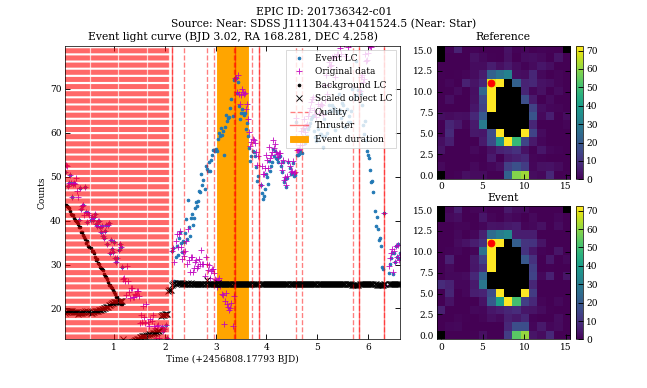

<IPython.core.display.Javascript object>


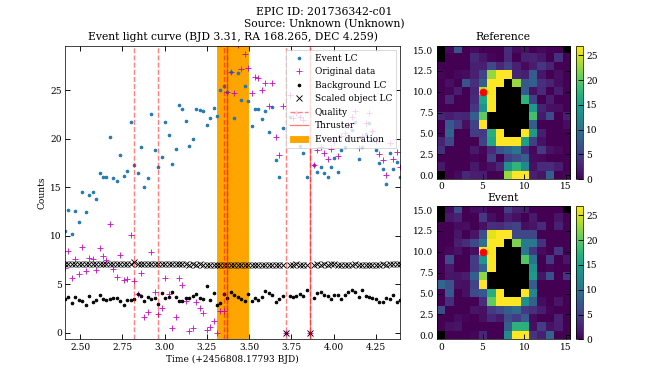

<IPython.core.display.Javascript object>


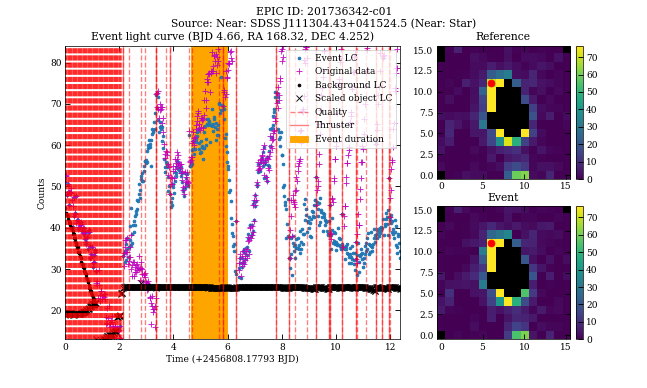

<IPython.core.display.Javascript object>


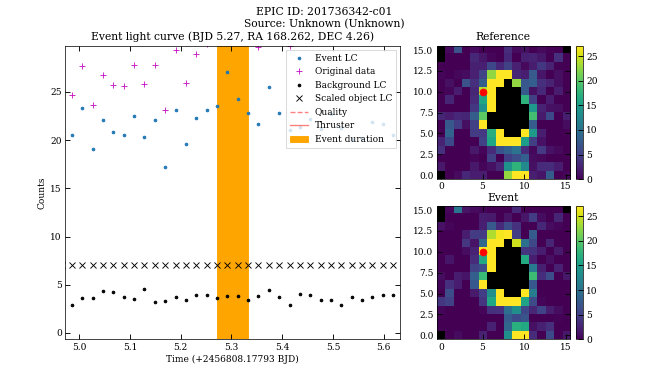

<IPython.core.display.Javascript object>


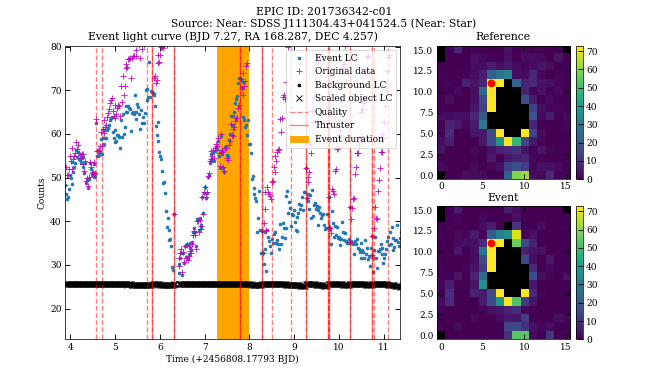

<IPython.core.display.Javascript object>


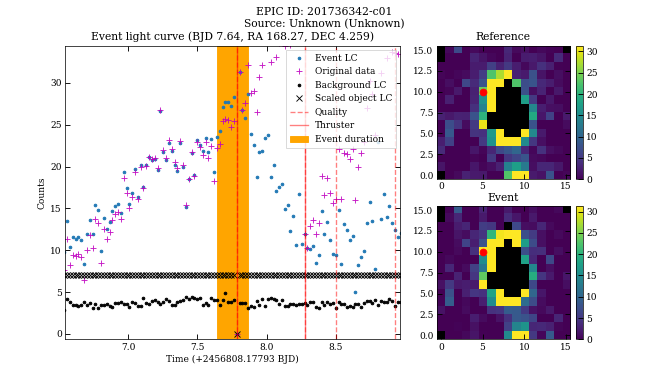

<IPython.core.display.Javascript object>


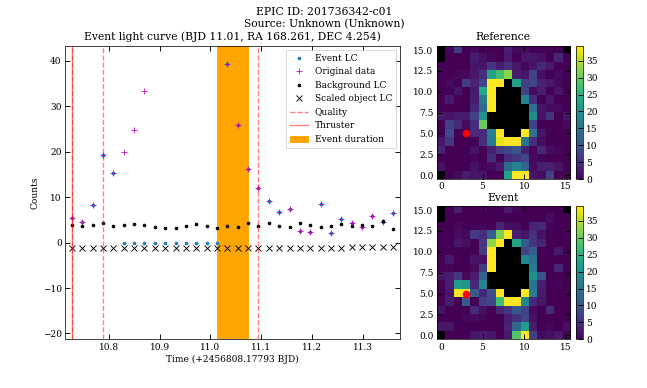

<IPython.core.display.Javascript object>


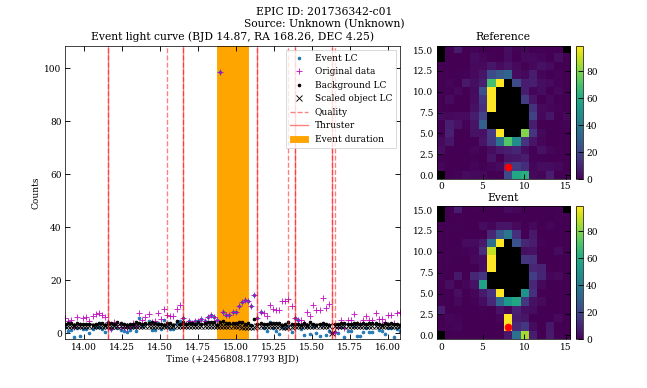

In [198]:
pixelfile = '/Users/ryanr/Documents/PhD/coding/Kepler/Data/ktwo201736342-c01_lpd-targ.fits.gz'#ktwo210780278-c13_lpd-targ.fits.gz'#ktwo201657691-c14_lpd-targ.fits.gz'#ktwo201223037-c01_lpd-targ.fits.gz'#ktwo248517243-c14_lpd-targ.fits.gz'#ktwo251457101-c14_lpd-targ.fits.gz'#ktwo201357268-c01_lpd-targ.fits.gz'#ktwo201834023-c01_lpd-targ.fits.gz'#'/Users/ryanr/Documents/PhD/coding/Kepler/pipelines/goldenrod/data/ktwo212269339-c06_lpd-targ.fits.gz'
save = '/Users/ryanr/Documents/PhD/coding/Kepler/K2'

try:
    hdu = fits.open(pixelfile)
    dat = hdu[1].data
    datacube = fits.ImageHDU(hdu[1].data.field('FLUX')[:]).data#np.copy(testdata)#
    if datacube.shape[1] > 1 and datacube.shape[2] > 1:
        print('in')
        time = dat["TIME"] + 2454833.0
        Qual = hdu[1].data.field('QUALITY')
        thrusters = np.where((Qual == 1048576) | (Qual == 1089568) | (Qual == 1056768) | (Qual == 1064960) | (Qual == 1081376) | (Qual == 10240) | (Qual == 32768) | (Qual == 1097760) | (Qual == 1048580) | (Qual == 1081348))[0]
        quality = np.where(Qual != 0)[0]
        #calculate the reference frame
        Framemin = thrusters[3]+1
        # Apply object mask to data
        Mask = ThrustObjectMask(datacube,thrusters)

        Maskdata, ast = First_pass(np.copy(datacube),Qual,quality,thrusters,pixelfile)
        Maskdata = Maskdata*Mask
        Maskdata = Motion_correction(Maskdata,Mask,thrusters)*Mask

        # Make a mask for the object to use as a test to eliminate very bad pointings
        obj = np.ma.masked_invalid(Mask).mask
        objmed = np.nanmedian(datacube[thrusters+1]*obj,axis=(0))
        objstd = np.nanstd(datacube[thrusters+1]*obj,axis=(0))

        framemask = np.zeros(Maskdata.shape)

        limit = abs(np.nanmedian(Maskdata[Qual == 0], axis = (0))+3*(np.nanstd(Maskdata[Qual == 0], axis = (0))))
        framemask = ((Maskdata/limit) >= 1)
        framemask[:,np.where(Maskdata > 100000)[1],np.where(Maskdata > 100000)[2]] = 0

        # Identify if there is a sequence of consecutive or near consecutive frames that meet condtition 


        #Eventmask_ref = (convolve(framemask,np.ones((1,3,3)),mode='constant', cval=0.0))*1
        #Eventmask = np.copy(Eventmask_ref)
        Eventmask = np.copy(framemask)
        Eventmask[~np.where((convolve(framemask,np.ones((5,1,1)),mode='constant', cval=0.0) >= 4))[0]] = 0
        Eventmask[Qual!=0,:,:] = False


        Index = np.where(np.nansum(Eventmask*1, axis = (1,2))>0)[0]
        EMcopy = np.copy(Eventmask)
        events = []
        eventtime = []
        eventmask = []
        while len(Index) > 1:

            triggers = np.where(EMcopy[Index[0]])
            for i in range(len(triggers[0])):
                similar = np.where(Eventmask[Index[0]:,triggers[0][i],triggers[1][i]]==1)[0] + Index[0]



                if len((np.diff(similar)<10)) > 1:
             #       print('in')
                    if len(np.where((np.diff(similar)<10) == False)[0]) > 0:
                        simEnd = np.where((np.diff(similar)<10) == False)[0][0] 
                        if Index[0] == 3446:
                            print(simEnd)
                    else:
                        simEnd = -1
                else:
                    simEnd = 0
                if (simEnd > 0):
                    similar = similar[:simEnd]
                elif (simEnd == 0):
                    similar = np.array([similar[0]])

                if len(similar) > 1:

                    events.append(similar[0])
                    temp = [similar[0]-1,similar[-1]+1]
                    eventtime.append(temp)
                    tempmask = np.zeros((Eventmask[Index[0]].shape))
                    tempmask[triggers[0][i],triggers[1][i]] = 1
                    eventmask.append(tempmask)
                    temp = []


                temp = EMcopy[similar]
                temp[:,triggers[0][i],triggers[1][i]] = False
                EMcopy[similar] = temp

                Index = np.where(np.nansum(EMcopy*1, axis = (1,2))>0)[0]
        events = np.array(events)          
        eventtime = np.array(eventtime)
        eventmask = np.array(eventmask)

        events, eventtime, eventmask = Match_events(events,eventtime,eventmask)#EventSplitter(events,eventtime,Eventmask,framemask)  

        #events = np.array(events)
        #eventmask = np.array(eventmask)
        #eventtime = np.array(eventtime)

        temp = []
        for i in range(len(events)):
            if len(np.where(datacube[eventtime[i][0]:eventtime[i][-1]]*eventmask[i] > 100000)[0]) == 0:
                temp.append(i)
        eventtime = eventtime[temp]
        events = events[temp]
        eventmask = eventmask[temp]

        #if len(eventmask) > 0:
        #    middle = (convolve(eventmask,np.ones((1,3,3))) == np.nanmax(convolve(eventmask,np.ones((1,3,3))))) & (convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0) == np.nanmax(convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0)))
        #    eventmask = eventmask*middle


        # Eliminate events that do not meet thruster firing conditions
        events, eventtime, eventmask, asteroid, asttime, astmask = ThrusterElim(events,eventtime,eventmask,thrusters,quality,Qual,Maskdata)
        events = np.array(events)
        eventtime = np.array(eventtime)
        eventmask = np.array(eventmask)

        #events, eventtime, eventmask = Match_events(events,eventtime,eventmask)



        # Create an array that saves the total area of mask and time. 
        # 1st col pixelfile, 2nd duration, 3rd col area, 4th col number of events, 5th 0 if in galaxy, 1 if outside
        # Define the coordinate system 
        funny_keywords = {'1CTYP4': 'CTYPE1',
                          '2CTYP4': 'CTYPE2',
                          '1CRPX4': 'CRPIX1',
                          '2CRPX4': 'CRPIX2',
                          '1CRVL4': 'CRVAL1',
                          '2CRVL4': 'CRVAL2',
                          '1CUNI4': 'CUNIT1',
                          '2CUNI4': 'CUNIT2',
                          '1CDLT4': 'CDELT1',
                          '2CDLT4': 'CDELT2',
                          '11PC4': 'PC1_1',
                          '12PC4': 'PC1_2',
                          '21PC4': 'PC2_1',
                          '22PC4': 'PC2_2'}
        mywcs = {}
        for oldkey, newkey in funny_keywords.items():
            mywcs[newkey] = hdu[1].header[oldkey] 
        mywcs = WCS(mywcs)

        # Save thrusts and quality flags and time 
        Fieldprop = {}
        Fieldprop['File'] = pixelfile
        Fieldprop['Thruster'] = len(thrusters)
        Fieldprop['Quality'] = len(quality)-len(thrusters)
        Fieldprop['Duration'] = len(time)
        Fieldprop['Gal_lat'] = Get_gal_lat(mywcs,datacube)

        # Find all spatially seperate objects in the event mask.
        Objmasks = Identify_masks(obj)
        Objmasks = np.array(Objmasks)
        
        if len(events) > 0:
            Source, SourceType = Database_event_check(Maskdata,eventtime,eventmask,mywcs)
            ObjName, ObjType = Database_check_mask(datacube,thrusters,Objmasks,mywcs)
            Near = Near_which_mask(eventmask,Objmasks)
            Maskobj = np.zeros((len(events),Maskdata.shape[1],Maskdata.shape[2])) # for plotting masked object reference
            if len(np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]) > 0:
                CentralMask = np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]
            elif len(np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]) > 1:
                CentralMask = np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0][0]
            else:
                CentralMask = -1
            if CentralMask == -1:
                Maskobj[:] = Mask
            else:
                Maskobj[:] = Objmasks[CentralMask]

            for ind in np.where(Near != -1)[0]:
                Source[ind] = 'Near: ' + ObjName[Near[ind]]
                SourceType[ind] = 'Near: ' + ObjType[Near[ind]]
                Maskobj[ind] = Objmasks[Near[ind]]


            # Print figures
            K2TranPixFig(events,eventtime,eventmask,Maskdata,time,Eventmask,mywcs,save,pixelfile,quality,thrusters,Framemin,datacube,Source,SourceType,Maskobj)
            #K2TranPixGif2(events,eventtime,eventmask,Maskdata,mywcs,save,pixelfile,Source,SourceType)


except (OSError):
    pass

## Hmm

In [4]:
from ipywidgets import interact
from ipywidgets import interact, interactive, fixed, interact_manual

In [141]:
def plttpf(f):
    fig, (ax1,ax2) = plt.subplots(1,2)
    
    ax1.plot(time-time[0], np.nansum(datacube*eventmask[-3],axis=(1,2)), 'r.', alpha=0.7,label='First detection')
    ax1.plot(time-time[0], np.nansum(datacube*eventmask[-2],axis=(1,2)), '.',color='orange', alpha=0.7,label='Second detection')

    ax1.set_ylim(0, 150)
    ax1.set_xlim(7, 14)
    ax1.axvline(time[f]-time[0],color='black')
    ax1.legend()
    ax1.set_ylabel('Counts')
    ax1.set_xlabel('Time (days)')
    
    im = ax2.imshow(datacube[f, :,:],vmin = 0,vmax = 60,origin='lower')
    ax2.plot(np.where(eventmask[-3]==1)[1],np.where(eventmask[-3]==1)[0],'r.')
    ax2.plot(np.where(eventmask[-2]==1)[1],np.where(eventmask[-2]==1)[0],'.',color='orange')
    c = plt.colorbar(im)
    c.set_label('Counts')
    fig.set_size_inches((10,4))
    plt.savefig(save+'/wanderer/frames/'+'Frame_' + str(int(f-360)).zfill(4)+'.png')
    plt.close();

In [9]:
interact(plttpf, f=(200,800,1));

interactive(children=(IntSlider(value=500, description='f', max=800, min=200), Output()), _dom_classes=('widget-interact',))

Save a video of the full event

<IPython.core.display.Javascript object>


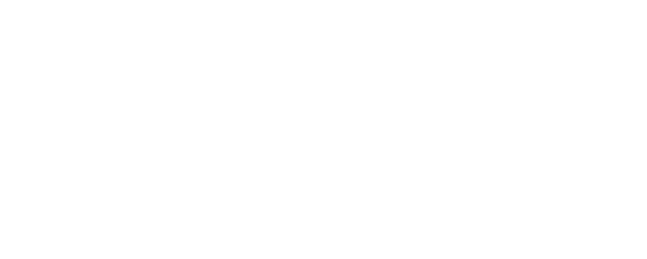

beep


<IPython.core.display.Javascript object>


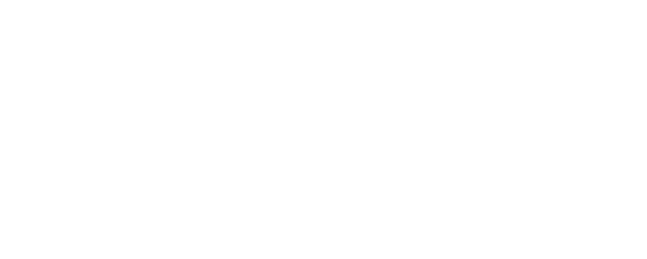

beep


<IPython.core.display.Javascript object>


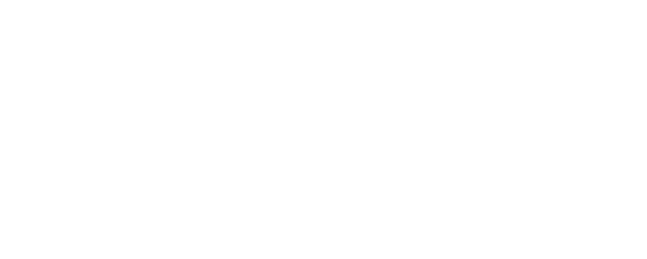

beep


<IPython.core.display.Javascript object>


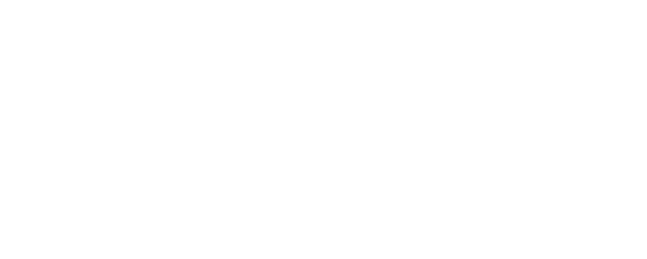

beep


<IPython.core.display.Javascript object>


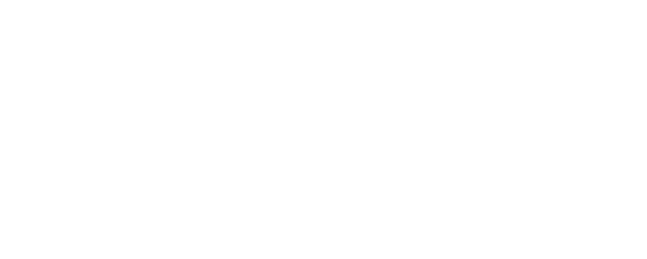

beep


<IPython.core.display.Javascript object>


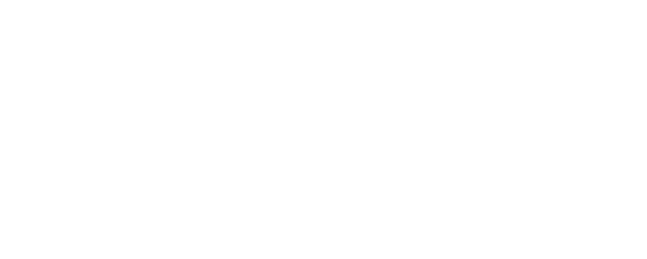

beep


<IPython.core.display.Javascript object>


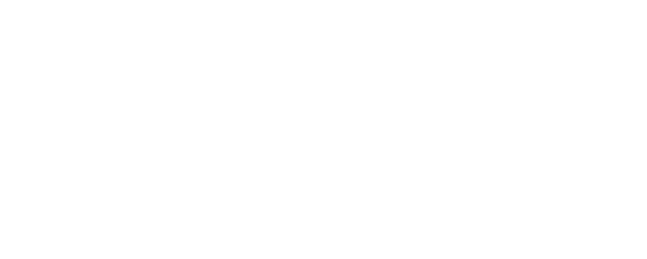

beep


<IPython.core.display.Javascript object>


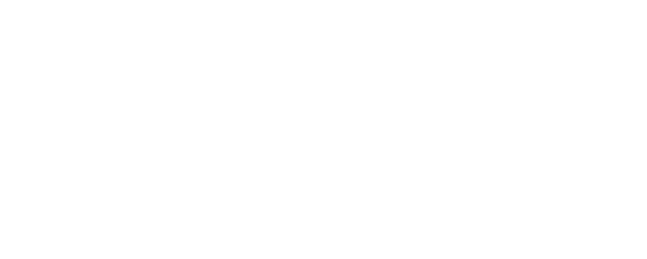

beep


<IPython.core.display.Javascript object>


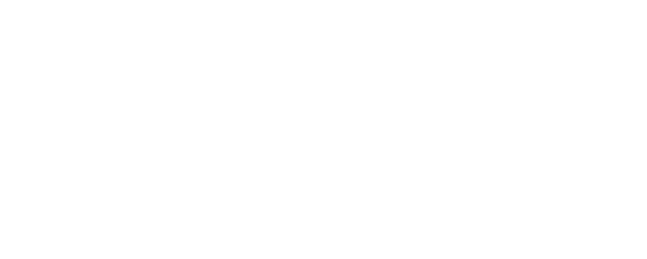

beep


<IPython.core.display.Javascript object>


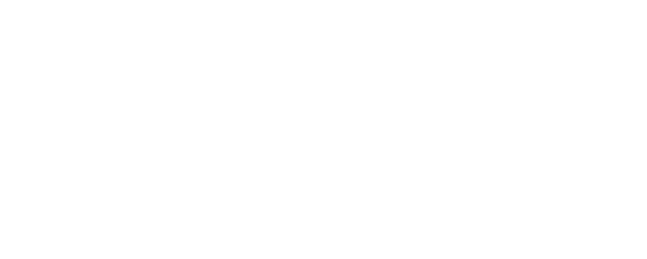

beep


<IPython.core.display.Javascript object>


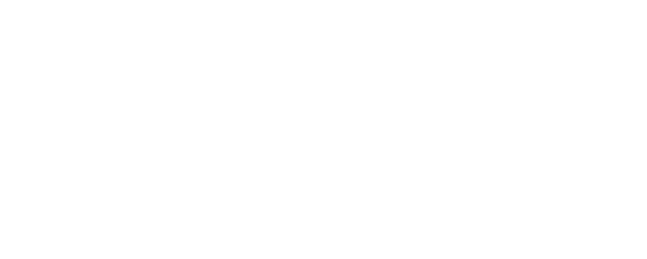

beep


<IPython.core.display.Javascript object>


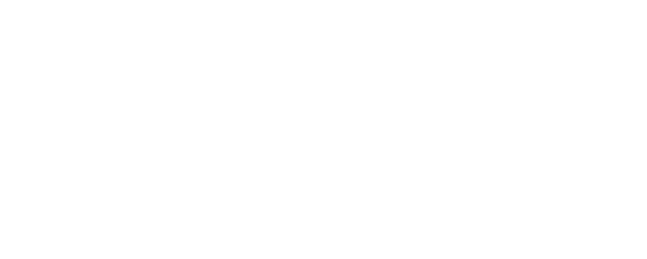

beep


<IPython.core.display.Javascript object>


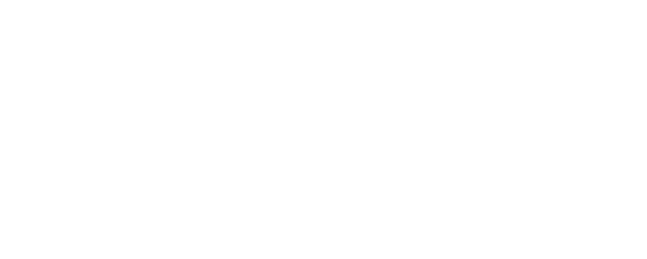

beep


<IPython.core.display.Javascript object>


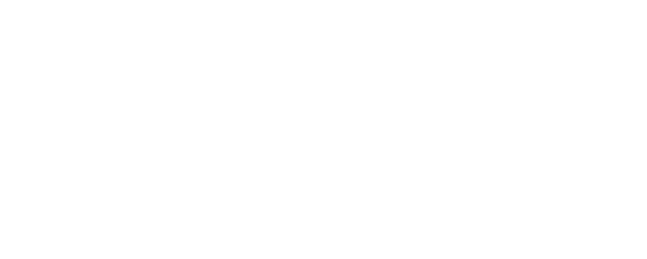

beep


<IPython.core.display.Javascript object>


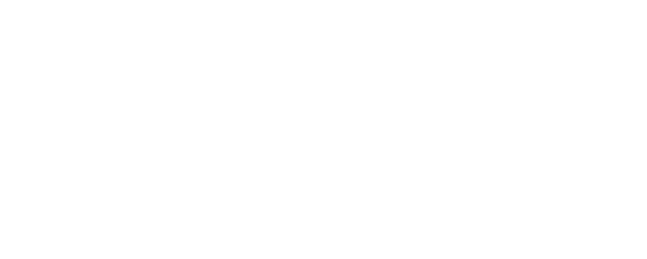

beep


<IPython.core.display.Javascript object>


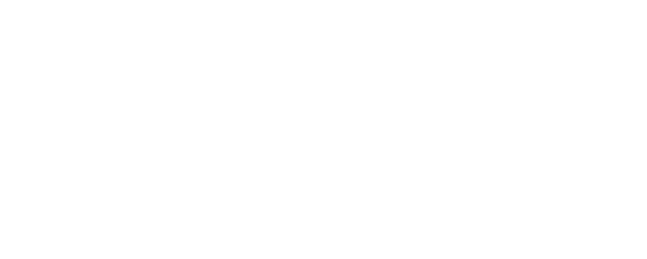

beep


<IPython.core.display.Javascript object>


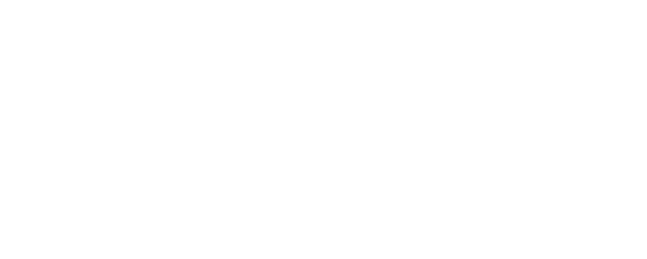

beep


<IPython.core.display.Javascript object>


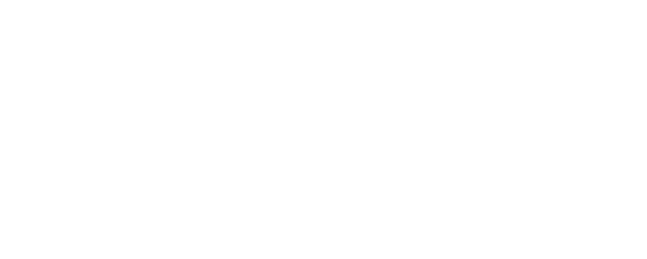

beep


<IPython.core.display.Javascript object>


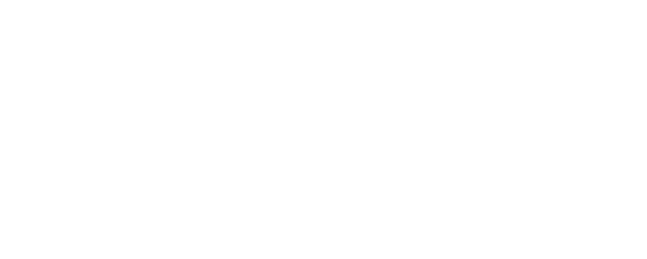

beep


<IPython.core.display.Javascript object>


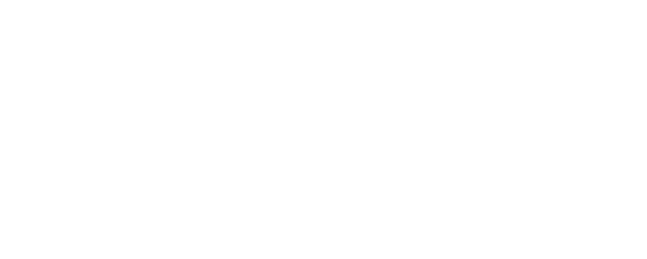

beep


<IPython.core.display.Javascript object>


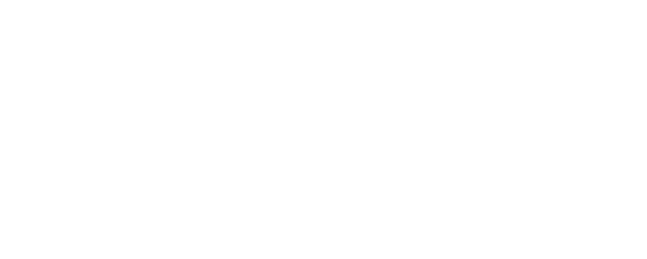

beep


<IPython.core.display.Javascript object>


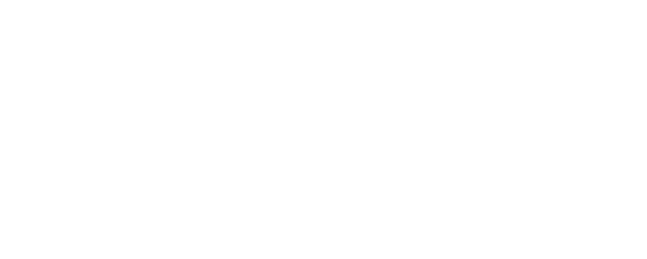

beep


<IPython.core.display.Javascript object>


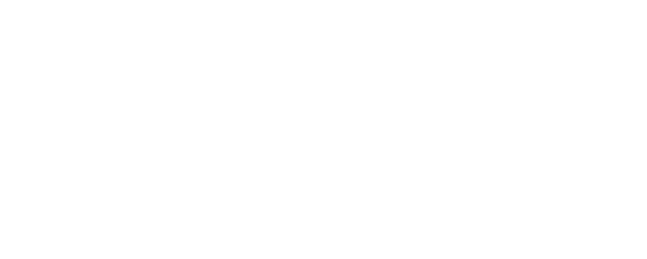

beep


<IPython.core.display.Javascript object>


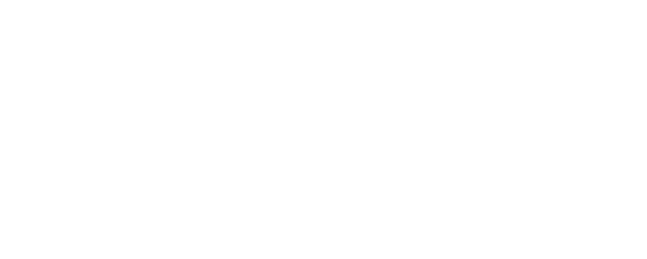

beep


<IPython.core.display.Javascript object>


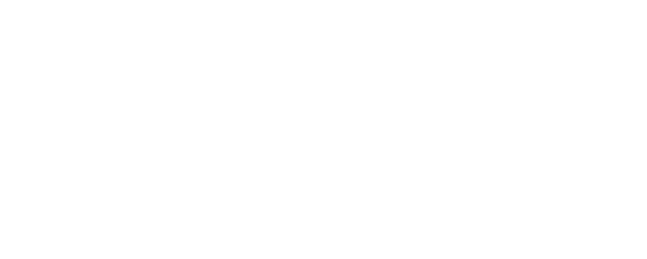

beep


<IPython.core.display.Javascript object>


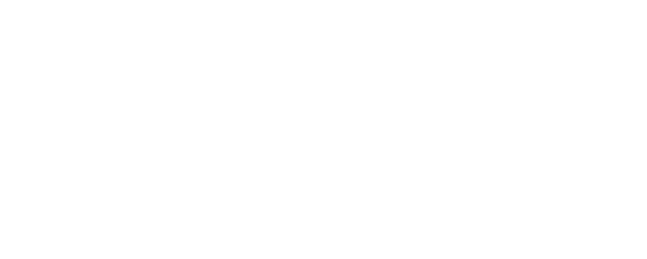

beep


<IPython.core.display.Javascript object>


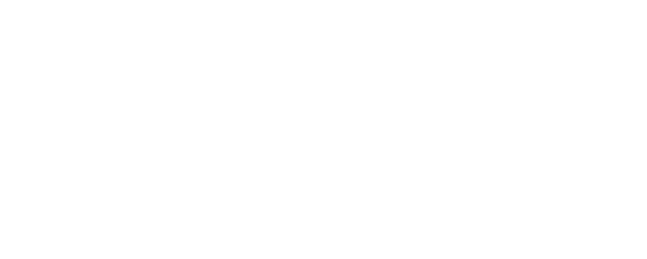

beep


<IPython.core.display.Javascript object>


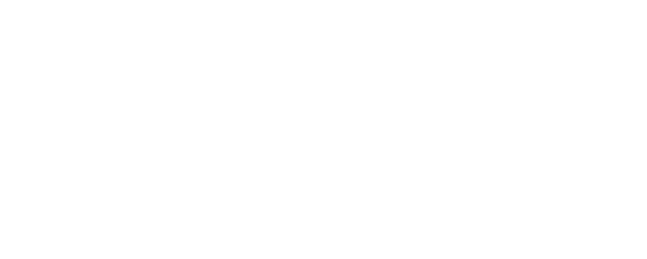

beep


<IPython.core.display.Javascript object>


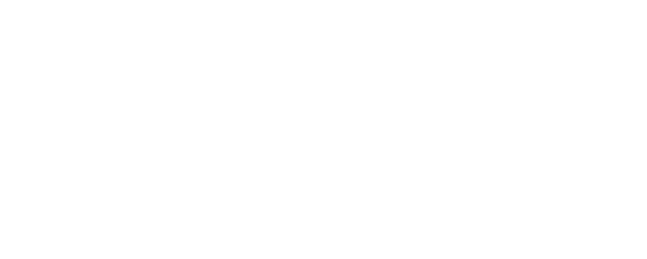

beep


<IPython.core.display.Javascript object>


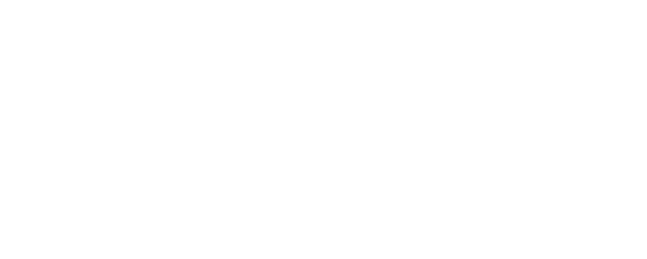

beep


<IPython.core.display.Javascript object>


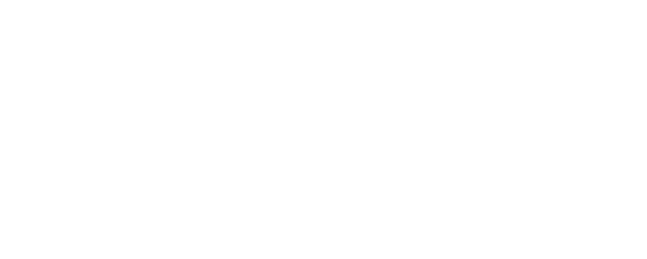

beep


<IPython.core.display.Javascript object>


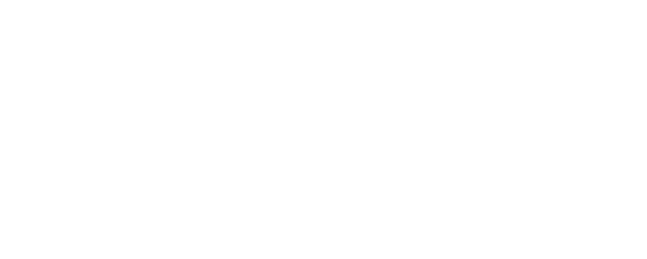

beep


<IPython.core.display.Javascript object>


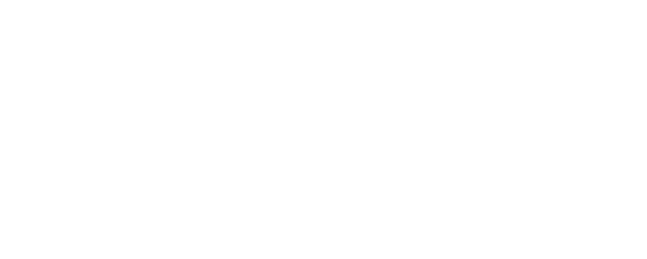

beep


<IPython.core.display.Javascript object>


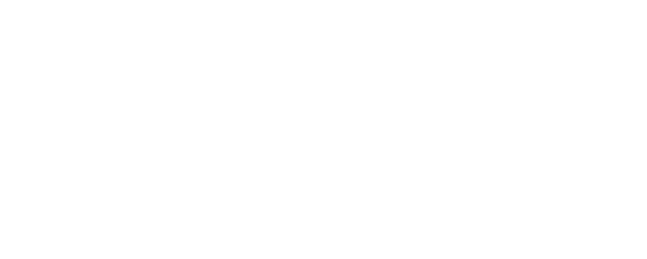

beep


<IPython.core.display.Javascript object>


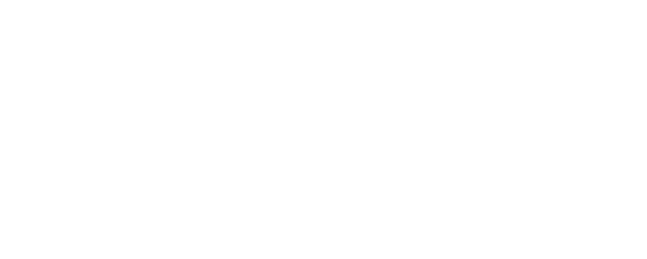

beep


<IPython.core.display.Javascript object>


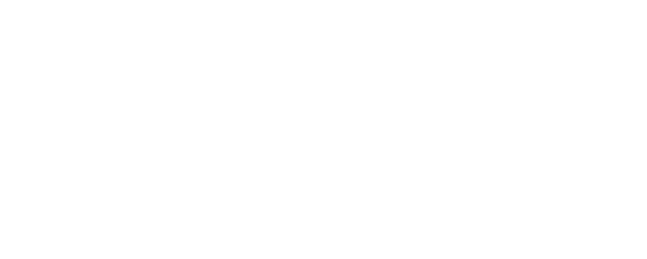

beep


<IPython.core.display.Javascript object>


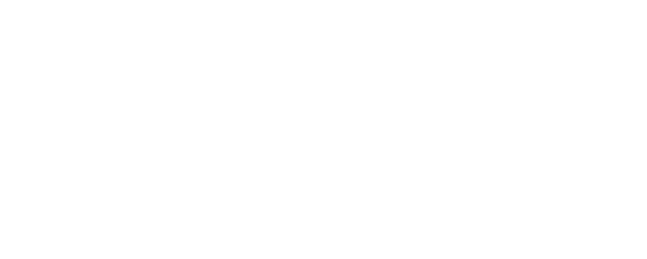

beep


<IPython.core.display.Javascript object>


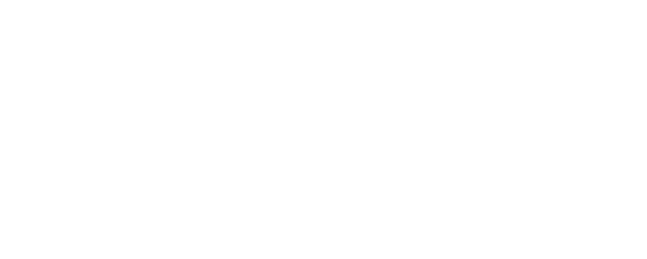

beep


<IPython.core.display.Javascript object>


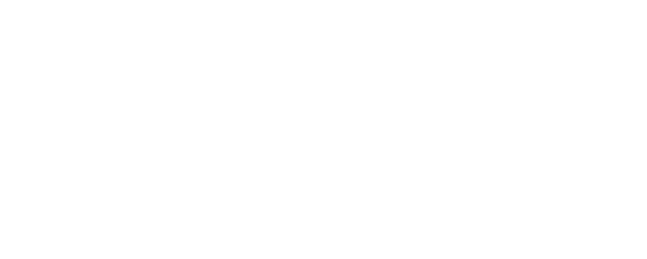

beep


<IPython.core.display.Javascript object>


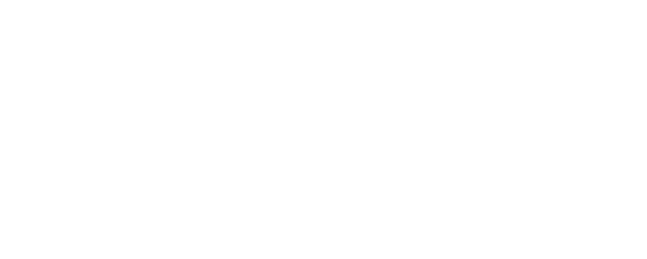

beep


<IPython.core.display.Javascript object>


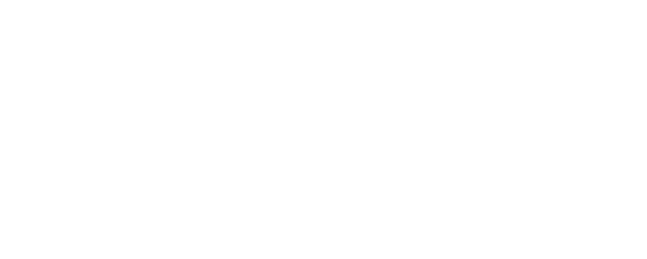

beep


<IPython.core.display.Javascript object>


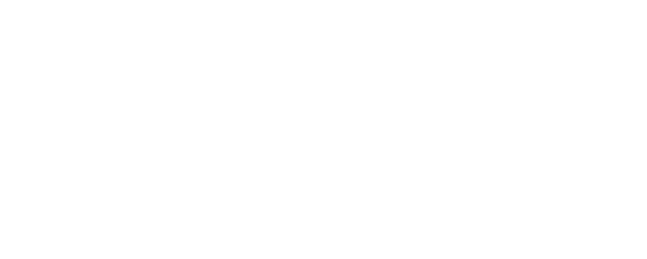

beep


<IPython.core.display.Javascript object>


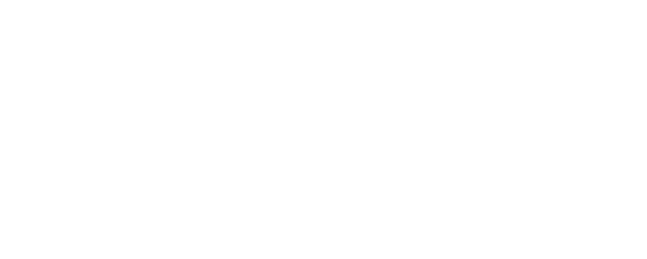

beep


<IPython.core.display.Javascript object>


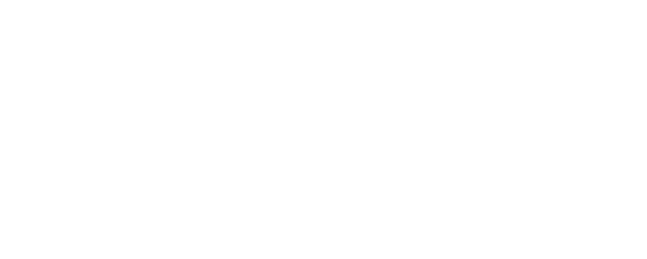

beep


<IPython.core.display.Javascript object>


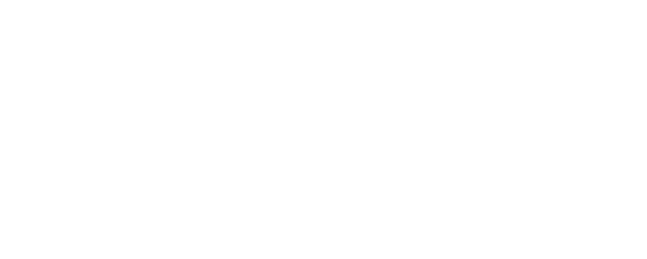

beep


<IPython.core.display.Javascript object>


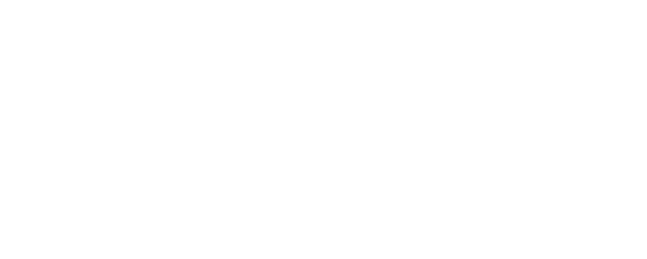

beep


<IPython.core.display.Javascript object>


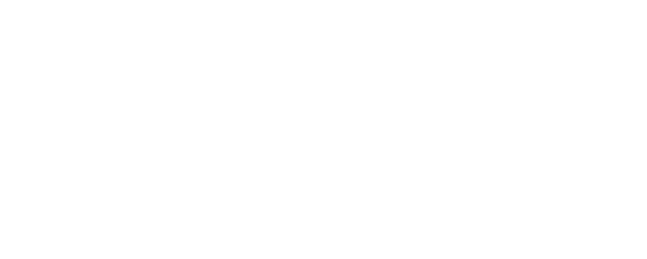

beep


<IPython.core.display.Javascript object>


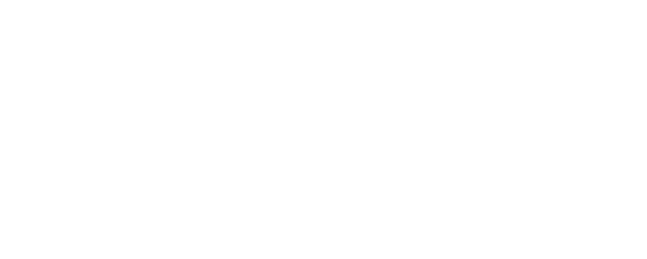

beep


<IPython.core.display.Javascript object>


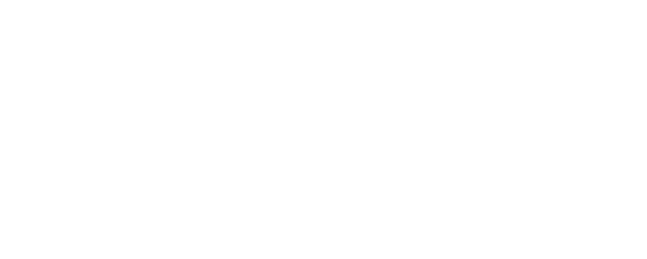

beep


<IPython.core.display.Javascript object>


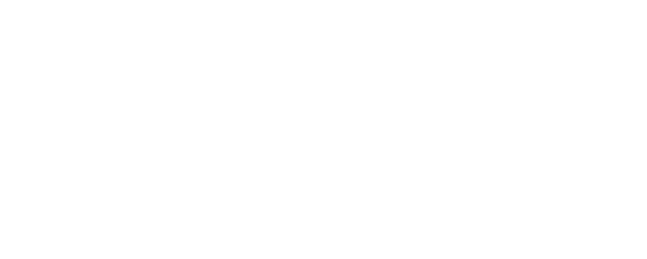

beep


<IPython.core.display.Javascript object>


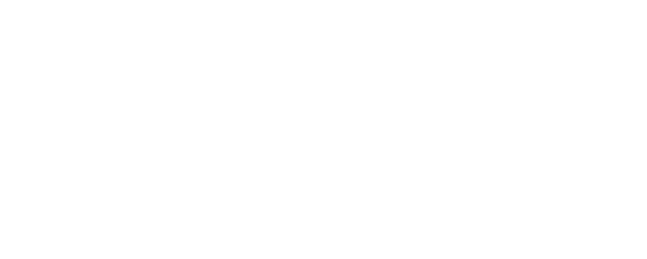

beep


<IPython.core.display.Javascript object>


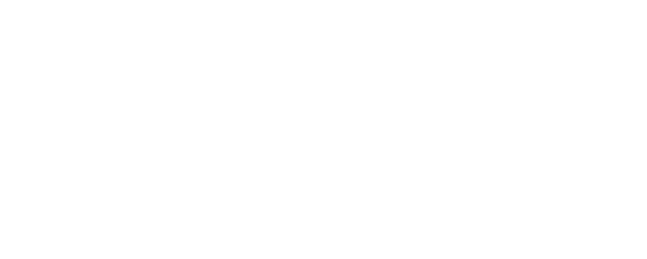

beep


<IPython.core.display.Javascript object>


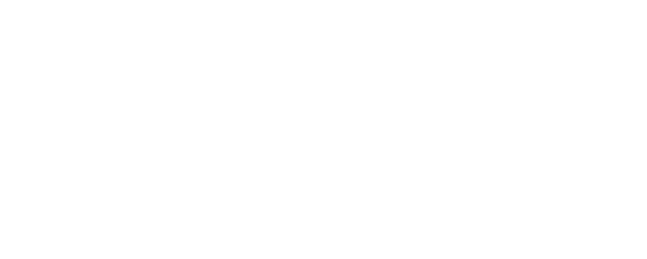

beep


<IPython.core.display.Javascript object>


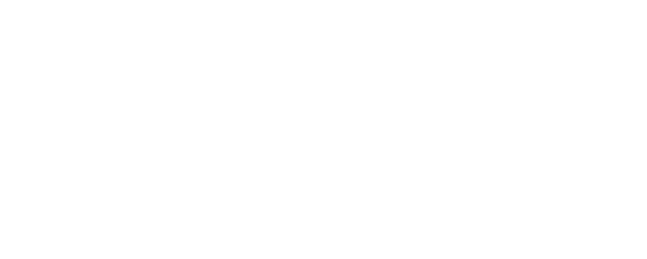

beep


<IPython.core.display.Javascript object>


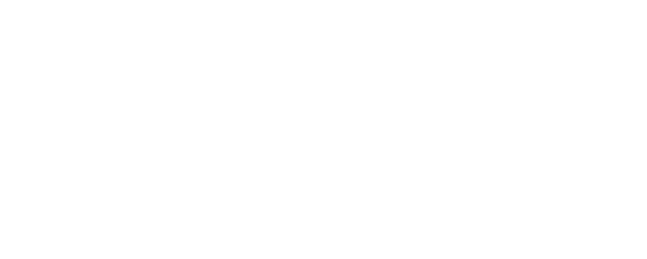

beep


<IPython.core.display.Javascript object>


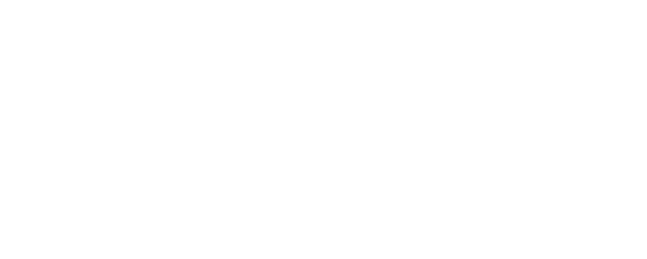

beep


<IPython.core.display.Javascript object>


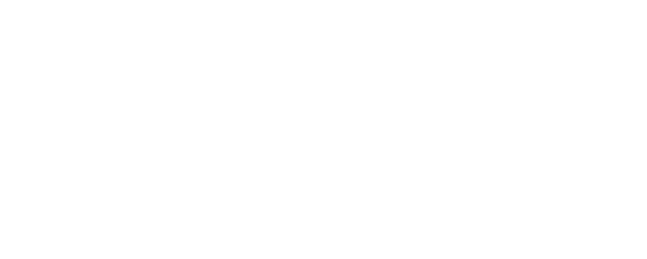

beep


<IPython.core.display.Javascript object>


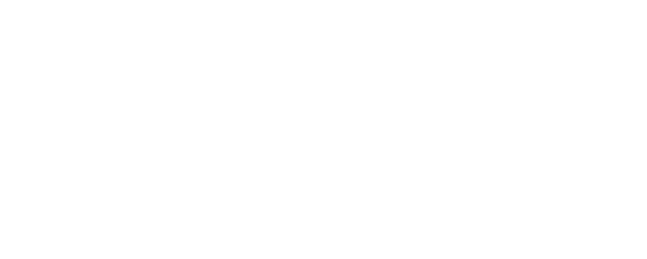

beep


<IPython.core.display.Javascript object>


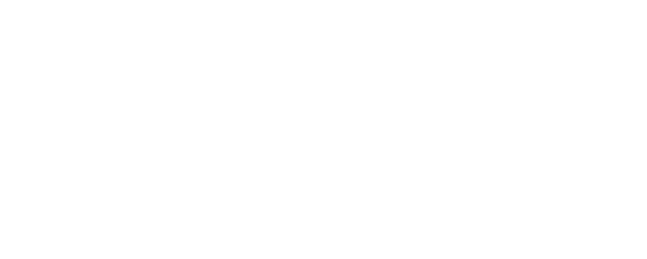

beep


<IPython.core.display.Javascript object>


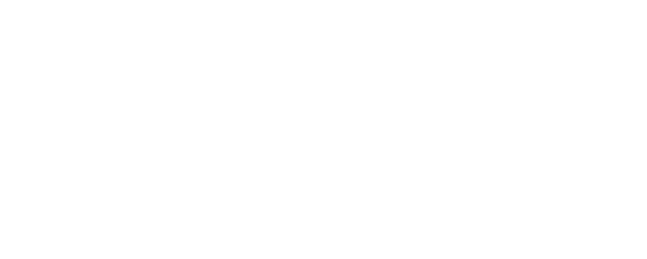

beep


<IPython.core.display.Javascript object>


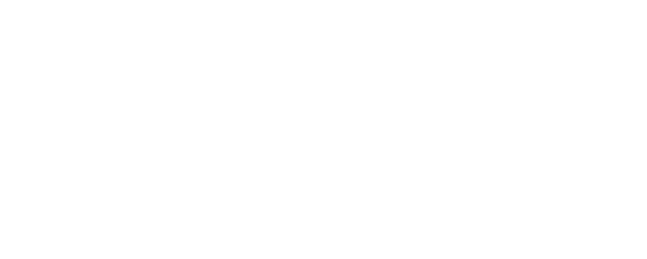

beep


<IPython.core.display.Javascript object>


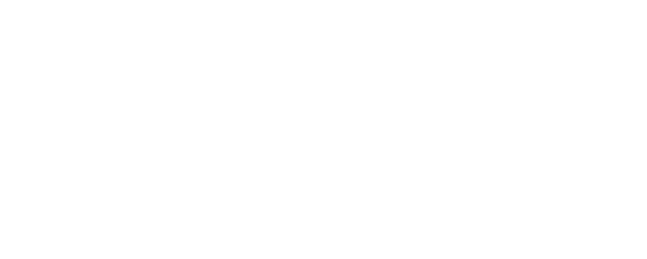

beep


<IPython.core.display.Javascript object>


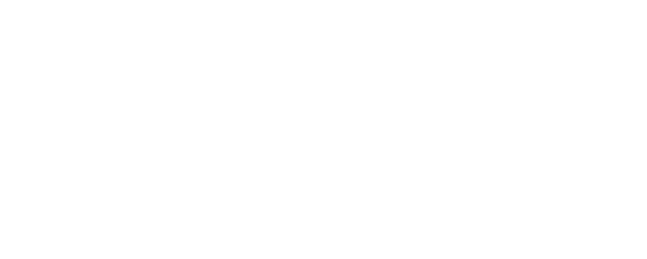

beep


<IPython.core.display.Javascript object>


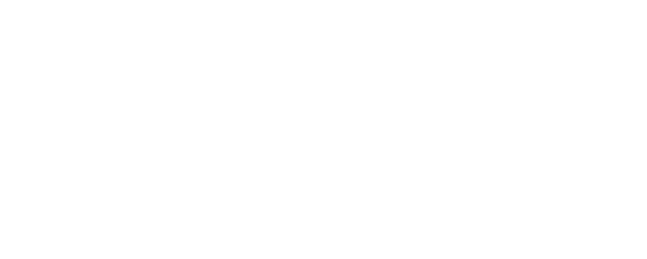

beep


<IPython.core.display.Javascript object>


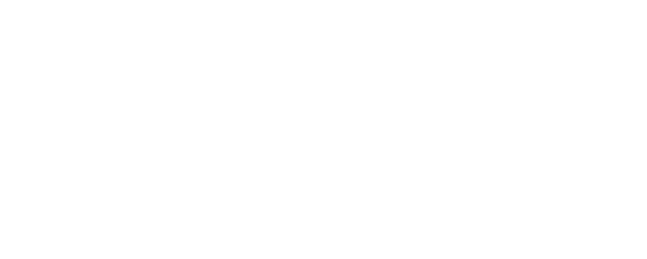

beep


<IPython.core.display.Javascript object>


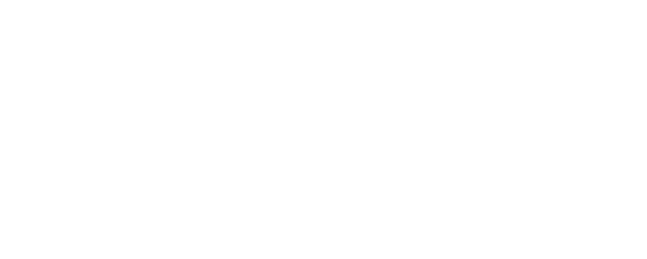

beep


<IPython.core.display.Javascript object>


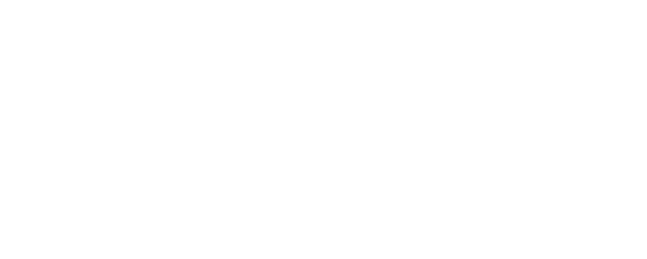

beep


<IPython.core.display.Javascript object>


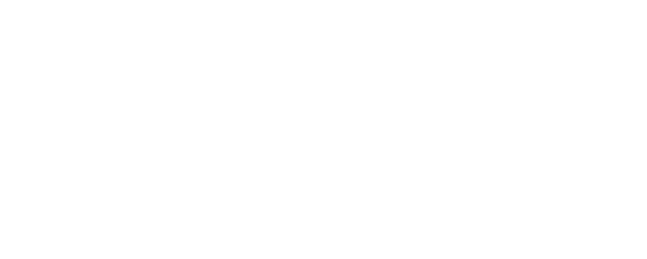

beep


<IPython.core.display.Javascript object>


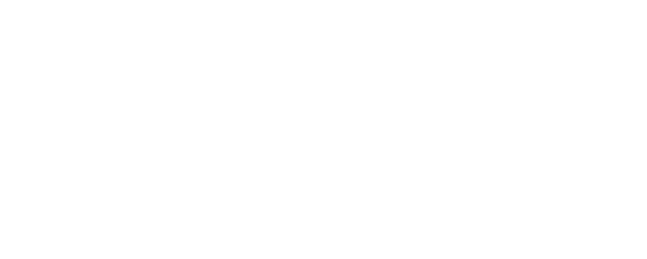

beep


<IPython.core.display.Javascript object>


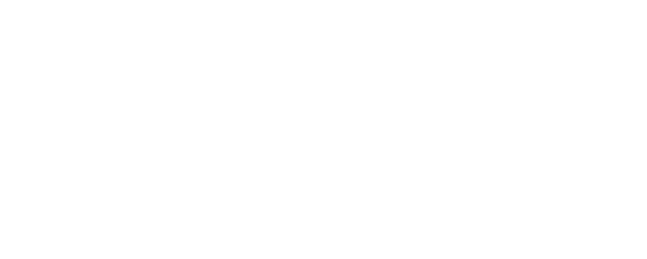

beep


<IPython.core.display.Javascript object>


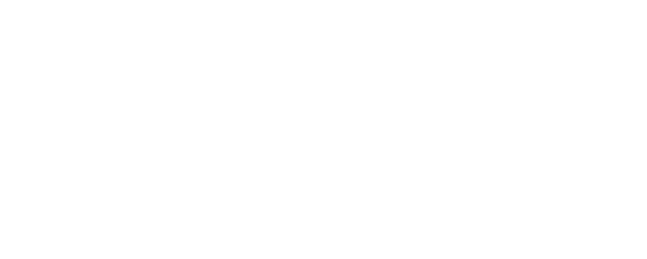

beep


<IPython.core.display.Javascript object>


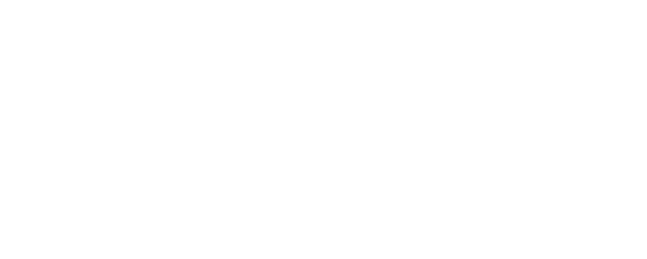

beep


<IPython.core.display.Javascript object>


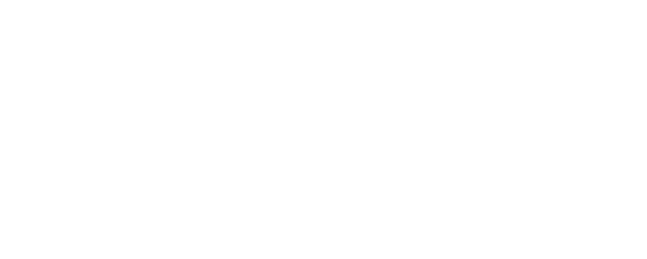

beep


<IPython.core.display.Javascript object>


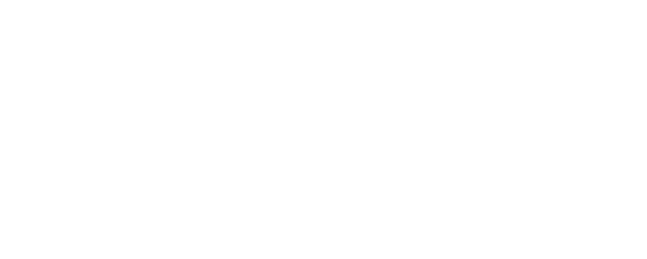

beep


<IPython.core.display.Javascript object>


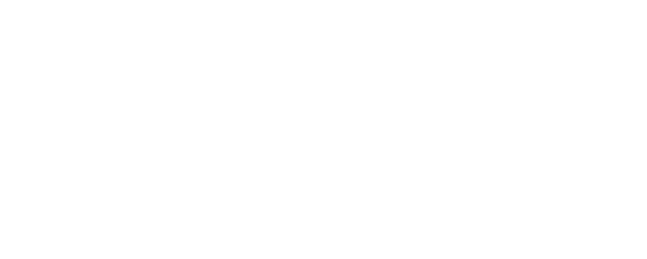

beep


<IPython.core.display.Javascript object>


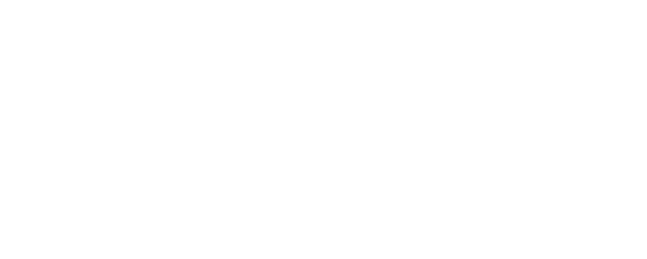

beep


<IPython.core.display.Javascript object>


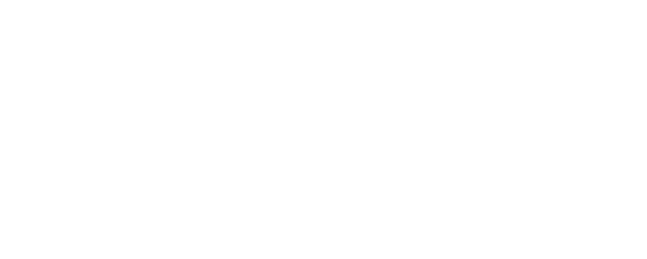

beep


<IPython.core.display.Javascript object>


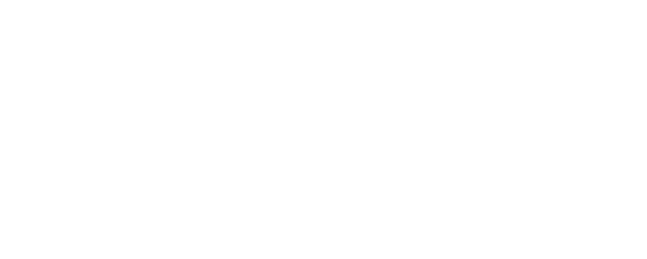

beep


<IPython.core.display.Javascript object>


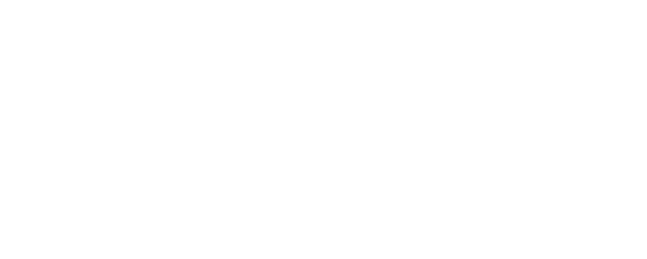

beep


<IPython.core.display.Javascript object>


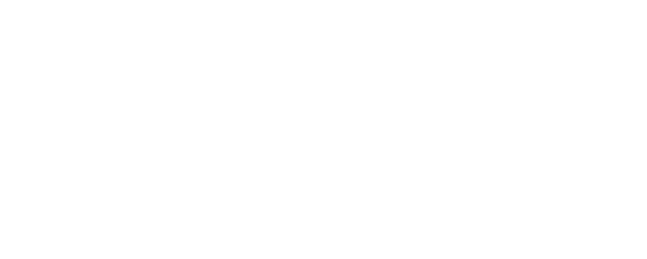

beep


<IPython.core.display.Javascript object>


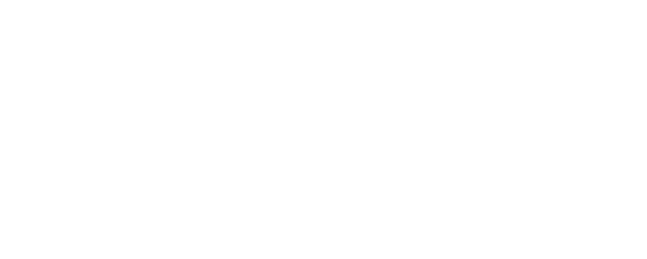

beep


<IPython.core.display.Javascript object>


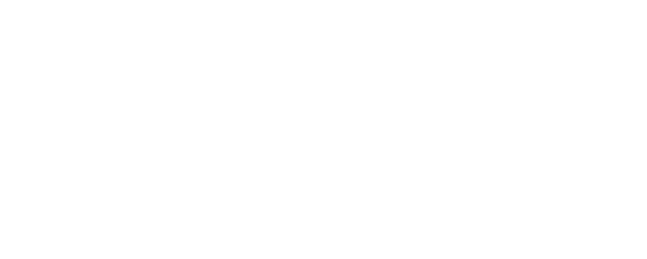

beep


<IPython.core.display.Javascript object>


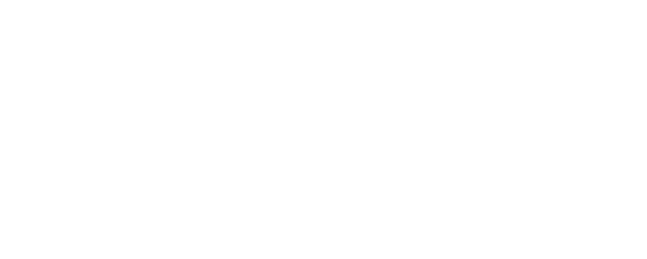

beep


<IPython.core.display.Javascript object>


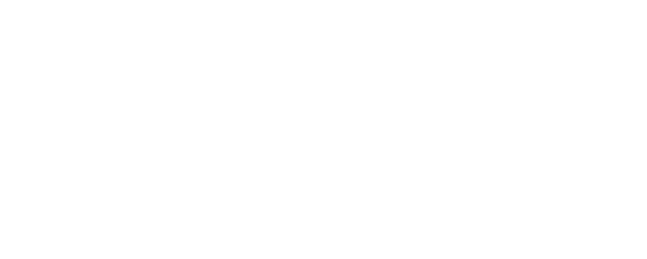

beep


<IPython.core.display.Javascript object>


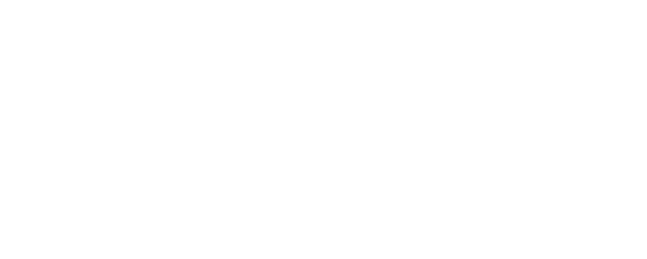

beep


<IPython.core.display.Javascript object>


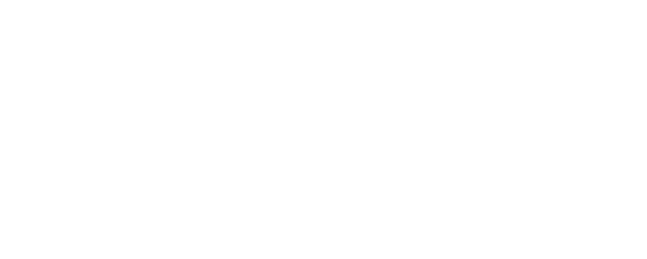

beep


<IPython.core.display.Javascript object>


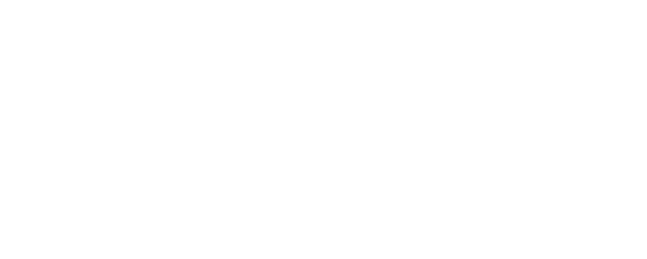

beep


<IPython.core.display.Javascript object>


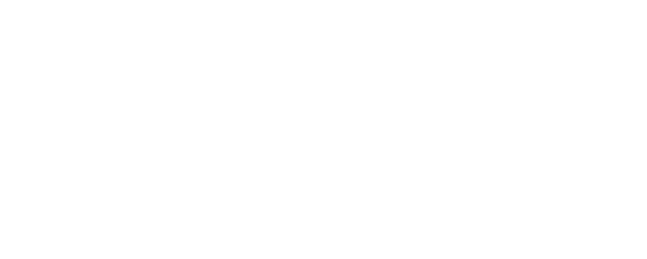

beep


<IPython.core.display.Javascript object>


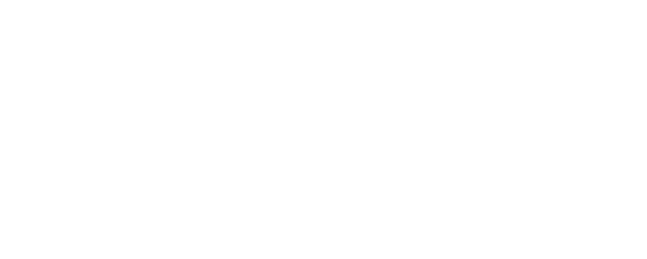

beep


<IPython.core.display.Javascript object>


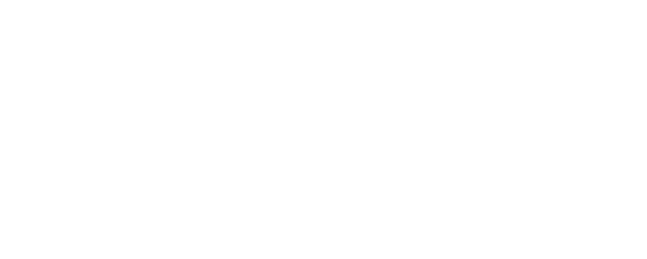

beep


<IPython.core.display.Javascript object>


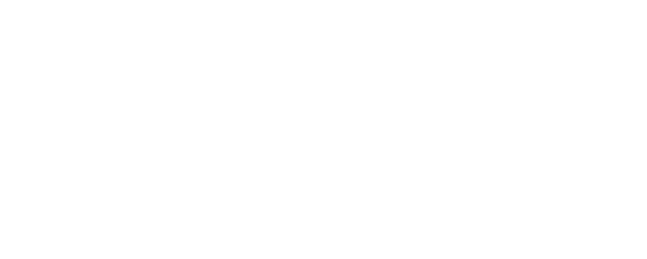

beep


<IPython.core.display.Javascript object>


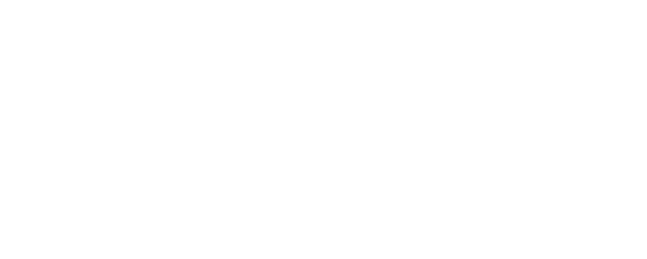

beep


<IPython.core.display.Javascript object>


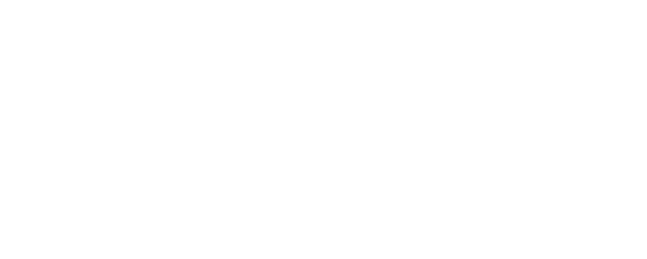

beep


<IPython.core.display.Javascript object>


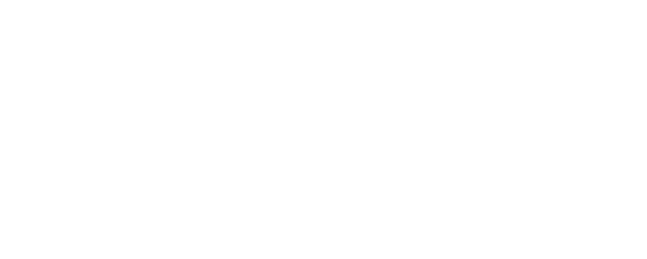

beep


<IPython.core.display.Javascript object>


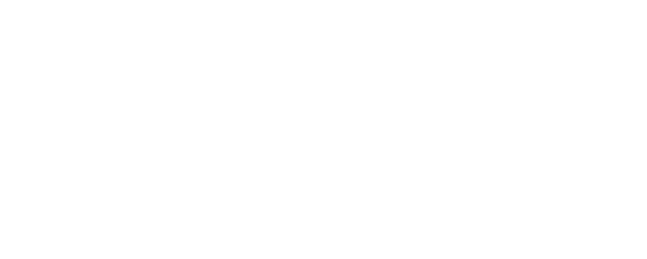

beep


<IPython.core.display.Javascript object>


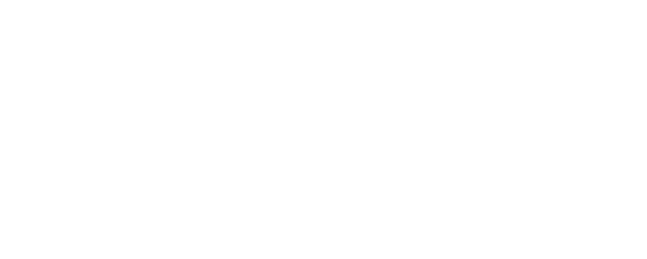

beep


<IPython.core.display.Javascript object>


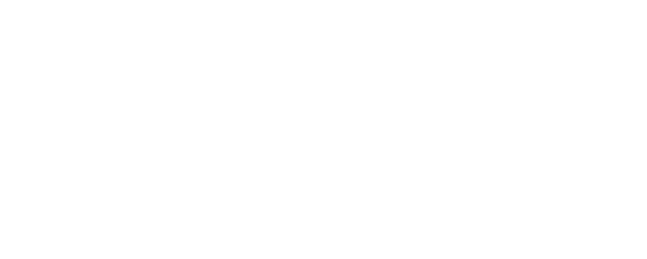

beep


<IPython.core.display.Javascript object>


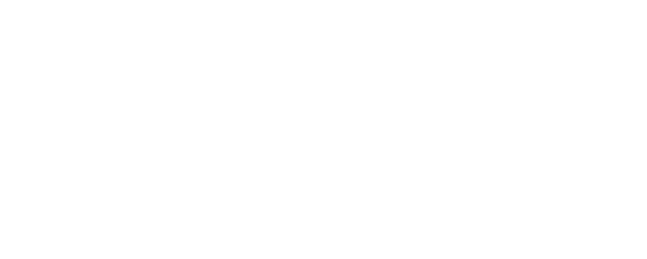

beep


<IPython.core.display.Javascript object>


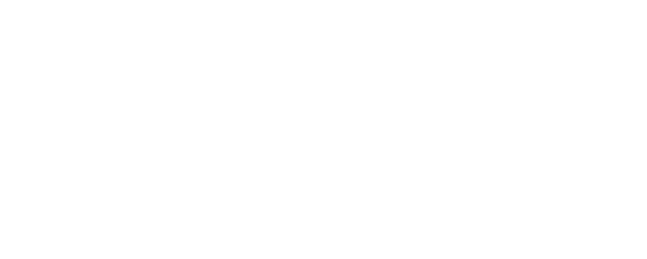

beep


<IPython.core.display.Javascript object>


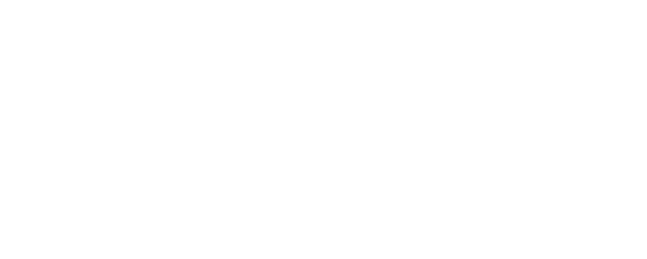

beep


<IPython.core.display.Javascript object>


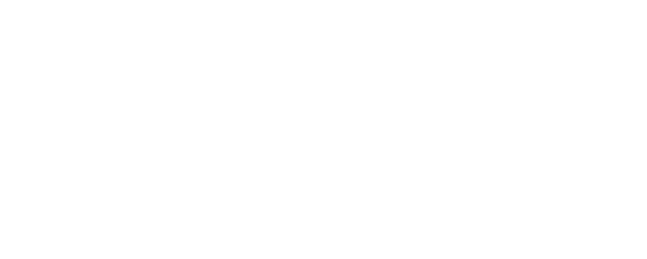

beep


<IPython.core.display.Javascript object>


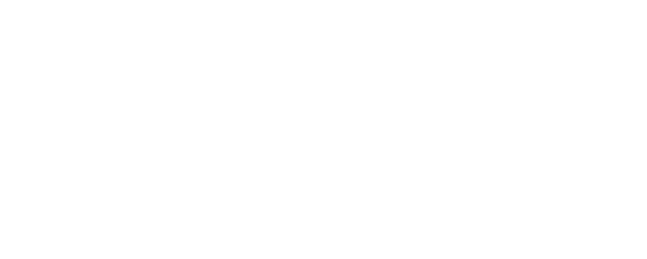

beep


<IPython.core.display.Javascript object>


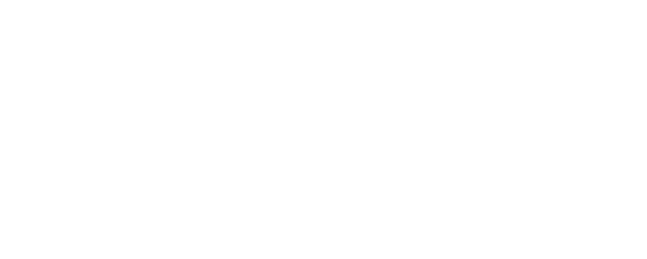

beep


<IPython.core.display.Javascript object>


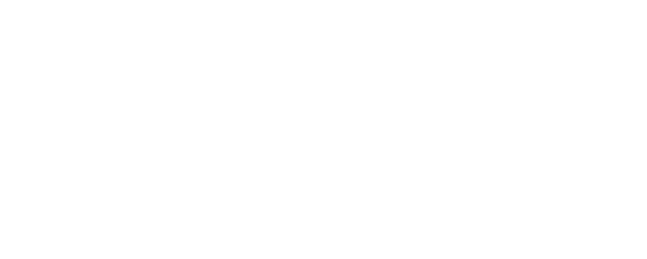

beep


<IPython.core.display.Javascript object>


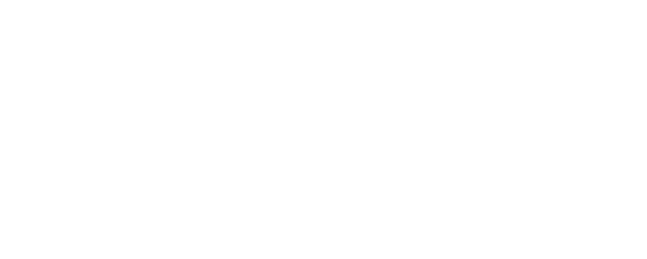

beep


<IPython.core.display.Javascript object>


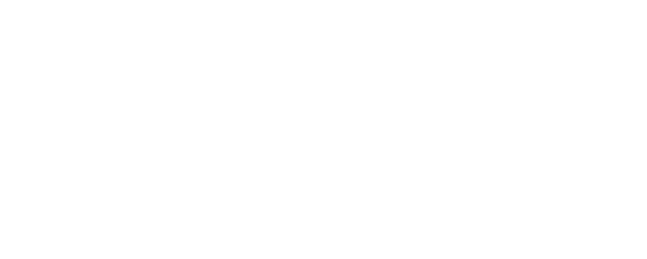

beep


<IPython.core.display.Javascript object>


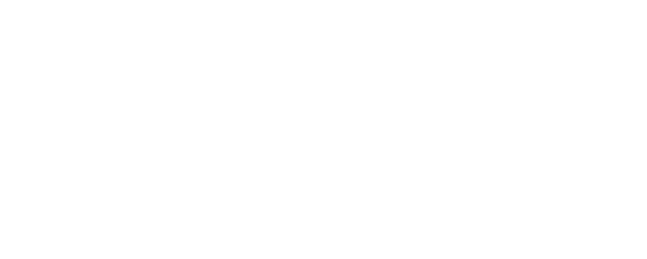

beep


<IPython.core.display.Javascript object>


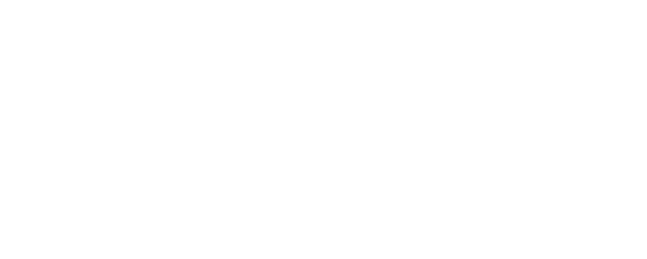

beep


<IPython.core.display.Javascript object>


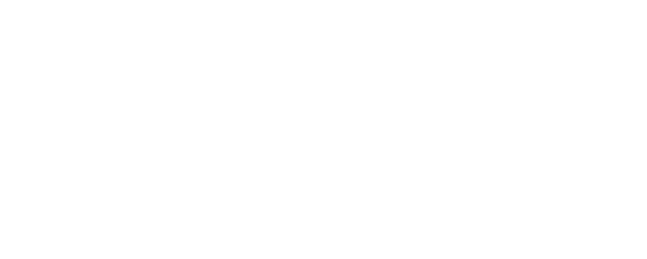

beep


<IPython.core.display.Javascript object>


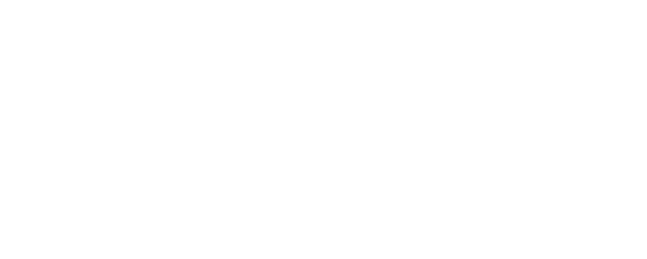

beep


<IPython.core.display.Javascript object>


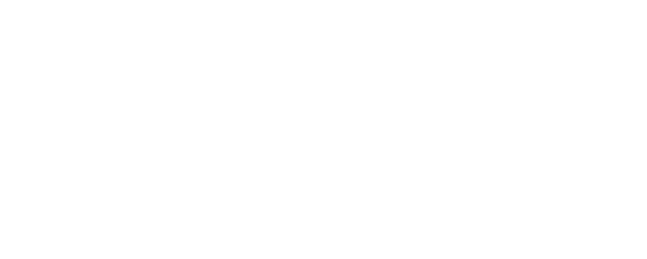

beep


<IPython.core.display.Javascript object>


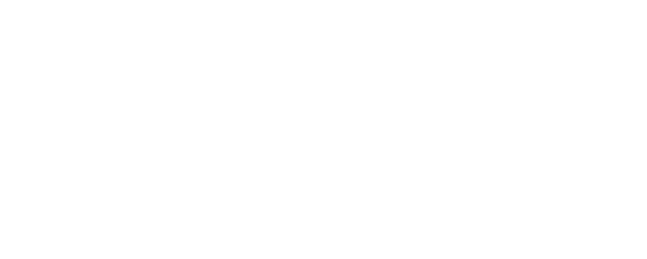

beep


<IPython.core.display.Javascript object>


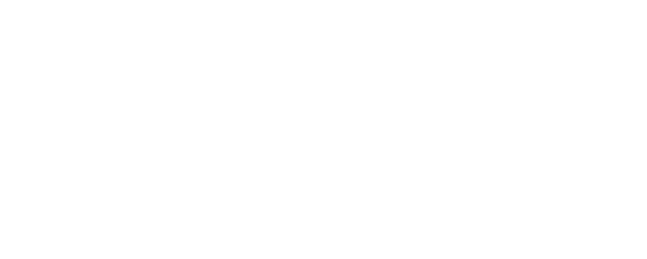

beep


<IPython.core.display.Javascript object>


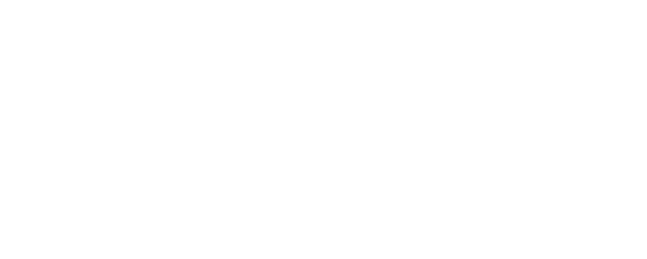

beep


<IPython.core.display.Javascript object>


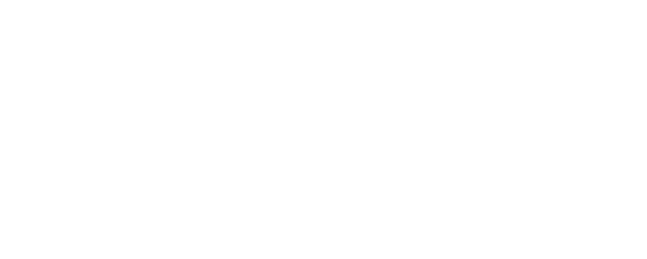

beep


<IPython.core.display.Javascript object>


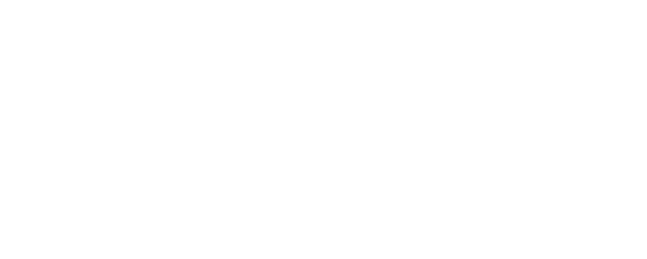

beep


<IPython.core.display.Javascript object>


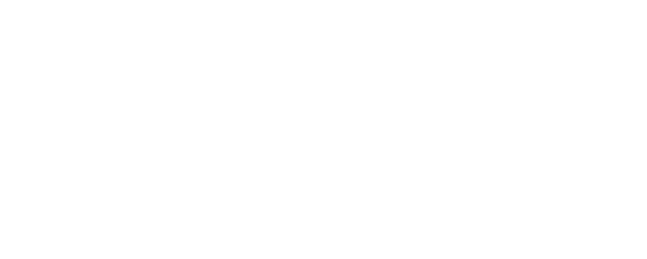

beep


<IPython.core.display.Javascript object>


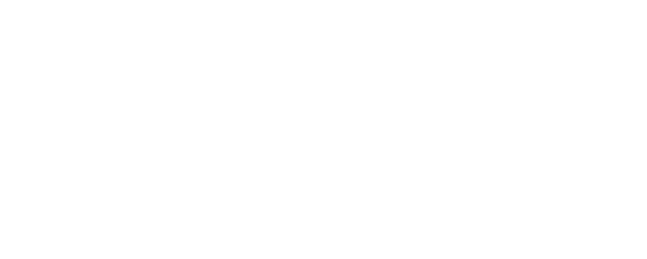

beep


<IPython.core.display.Javascript object>


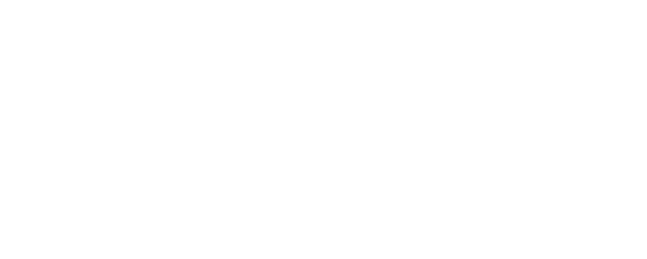

beep


<IPython.core.display.Javascript object>


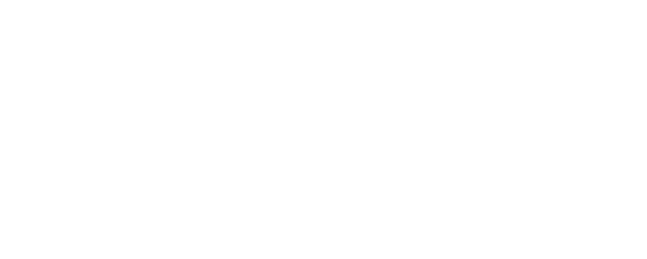

beep


<IPython.core.display.Javascript object>


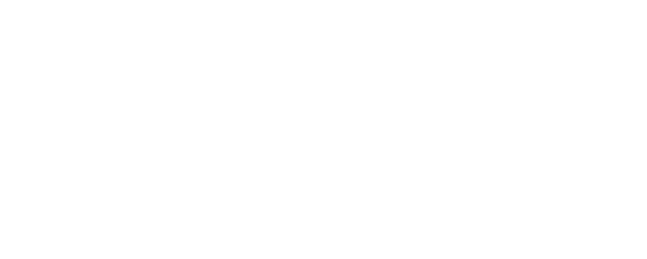

beep


<IPython.core.display.Javascript object>


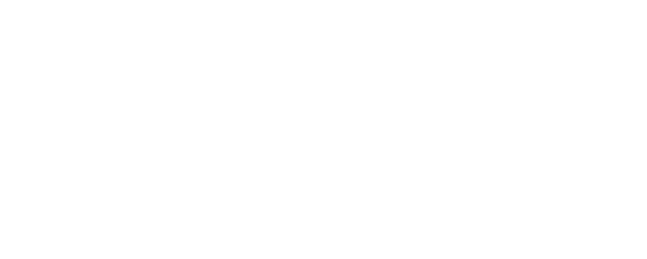

beep


<IPython.core.display.Javascript object>


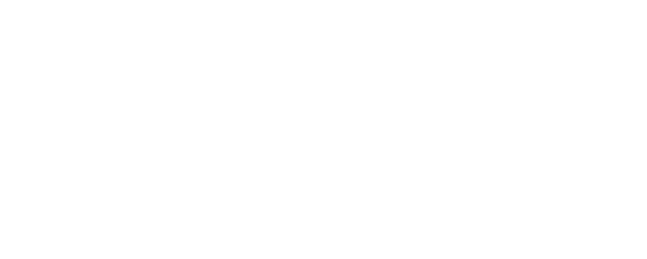

beep


<IPython.core.display.Javascript object>


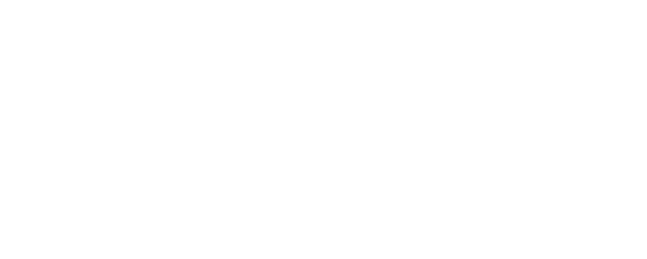

beep


<IPython.core.display.Javascript object>


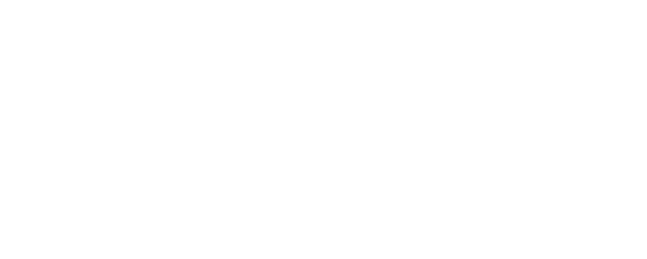

beep


<IPython.core.display.Javascript object>


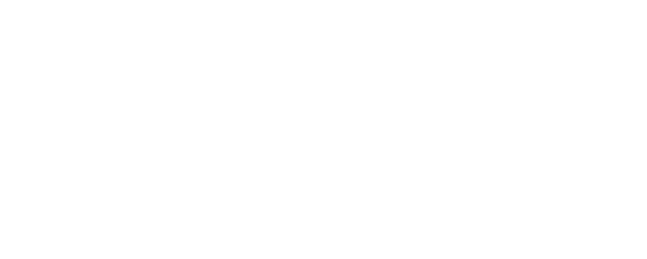

beep


<IPython.core.display.Javascript object>


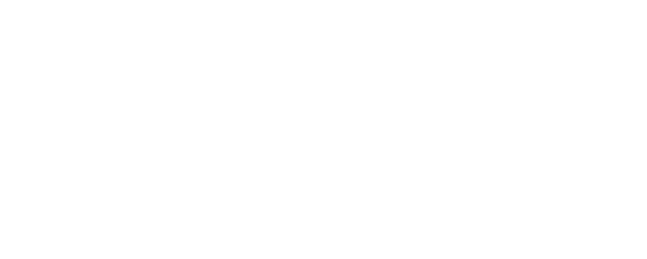

beep


<IPython.core.display.Javascript object>


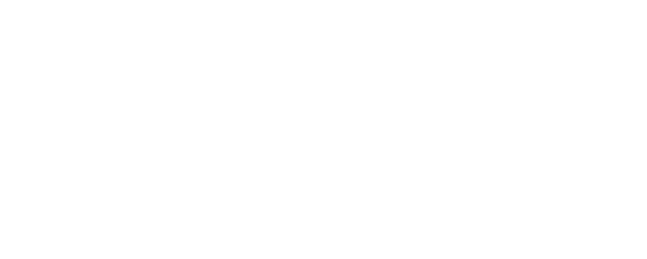

beep


<IPython.core.display.Javascript object>


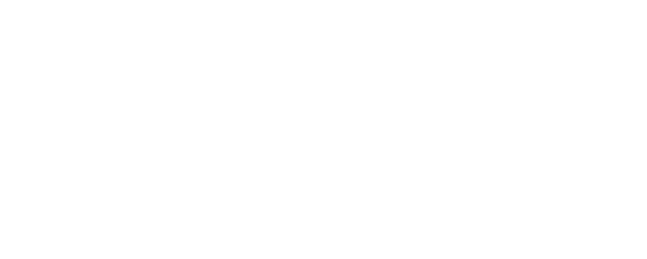

beep


<IPython.core.display.Javascript object>


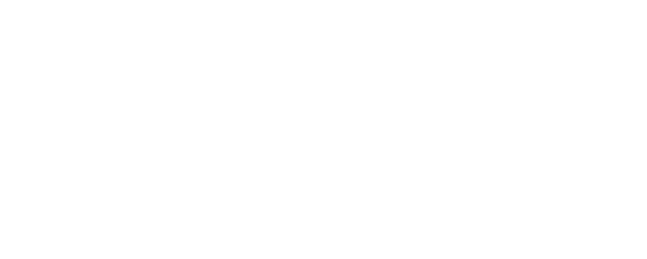

beep


<IPython.core.display.Javascript object>


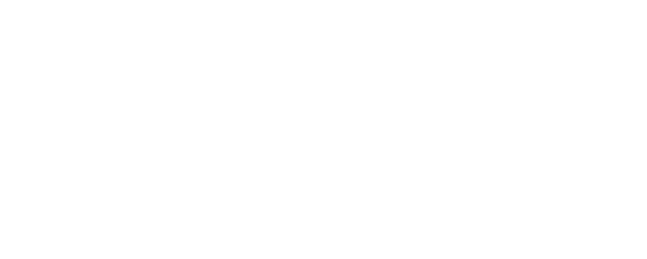

beep


<IPython.core.display.Javascript object>


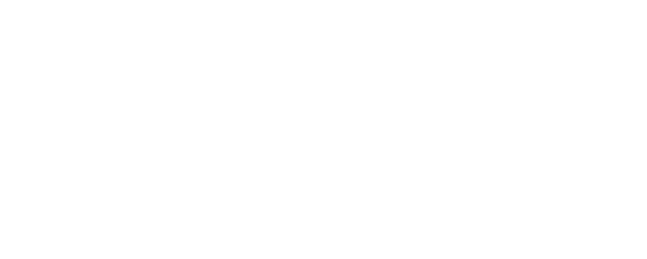

beep


<IPython.core.display.Javascript object>


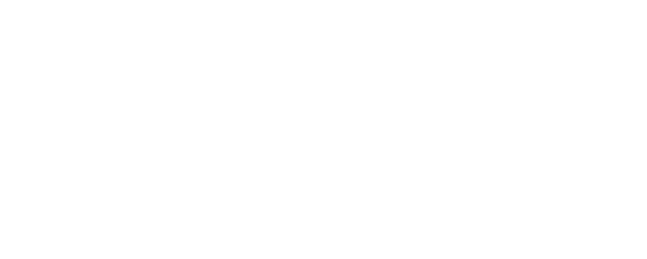

beep


<IPython.core.display.Javascript object>


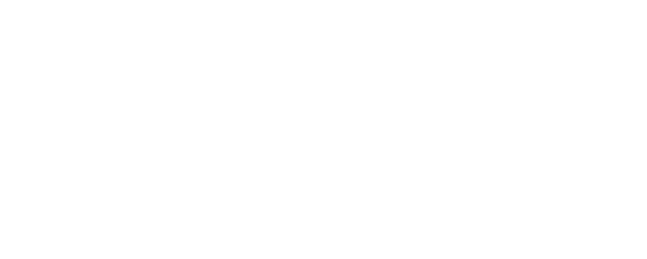

beep


<IPython.core.display.Javascript object>


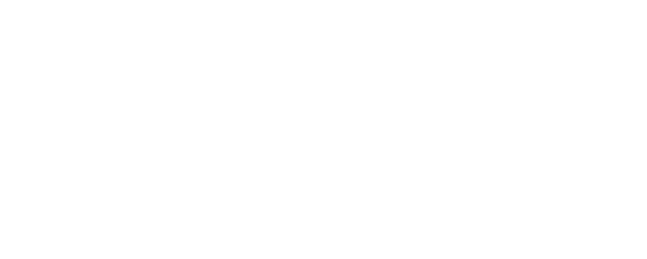

beep


<IPython.core.display.Javascript object>


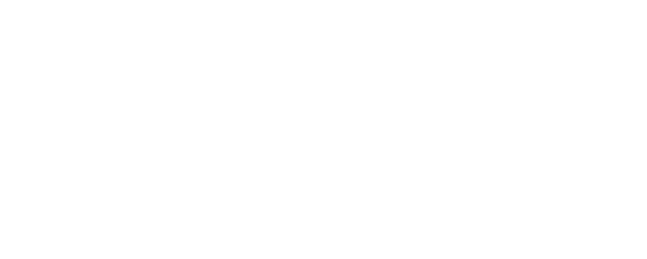

beep


<IPython.core.display.Javascript object>


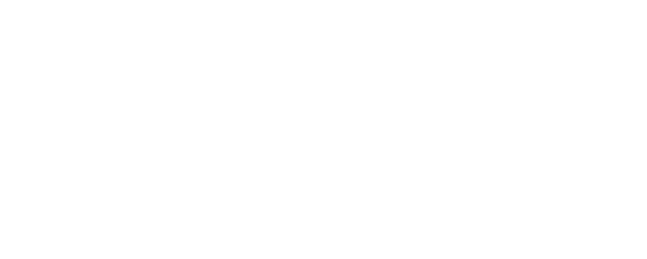

beep


<IPython.core.display.Javascript object>


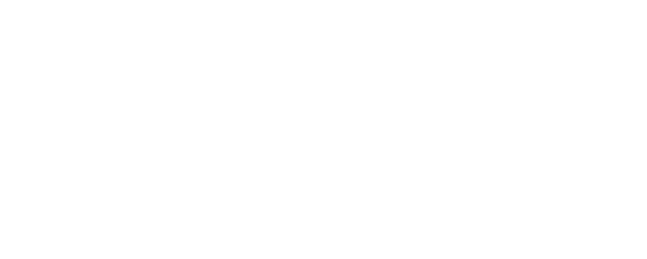

beep


<IPython.core.display.Javascript object>


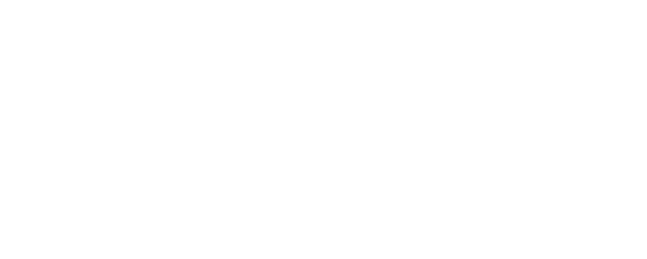

beep


<IPython.core.display.Javascript object>


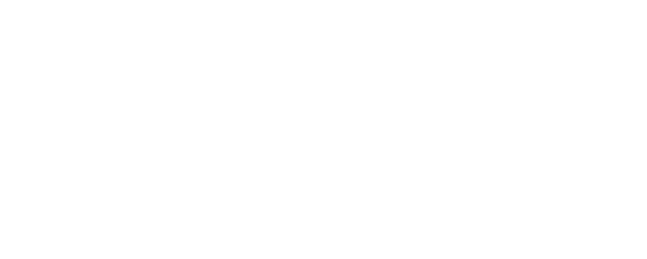

beep


<IPython.core.display.Javascript object>


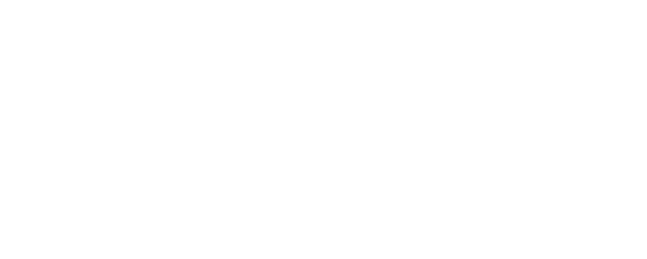

beep


<IPython.core.display.Javascript object>


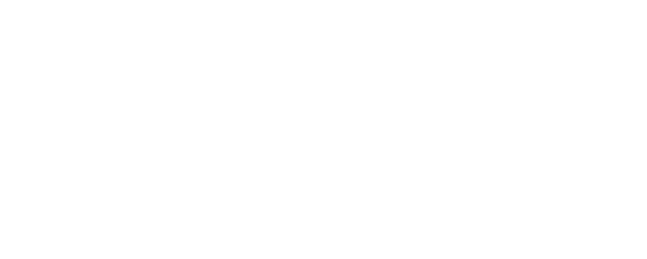

beep


<IPython.core.display.Javascript object>


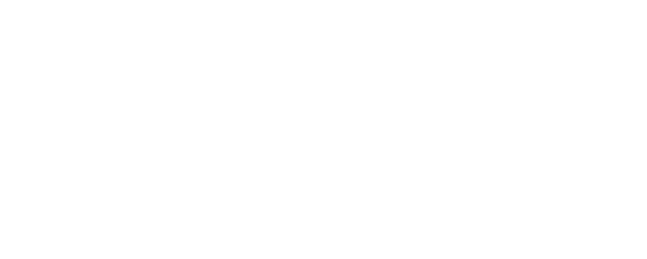

beep


<IPython.core.display.Javascript object>


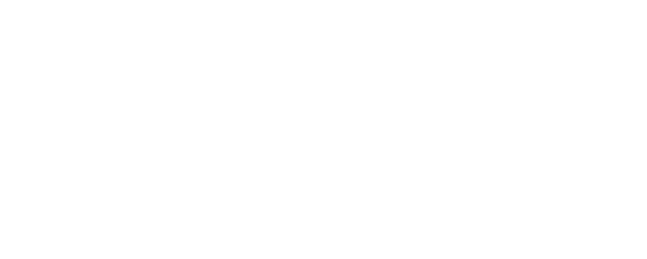

beep


<IPython.core.display.Javascript object>


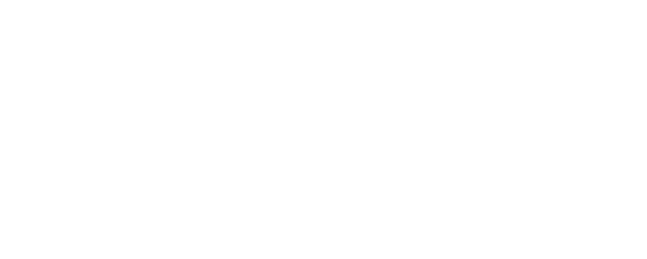

beep


<IPython.core.display.Javascript object>


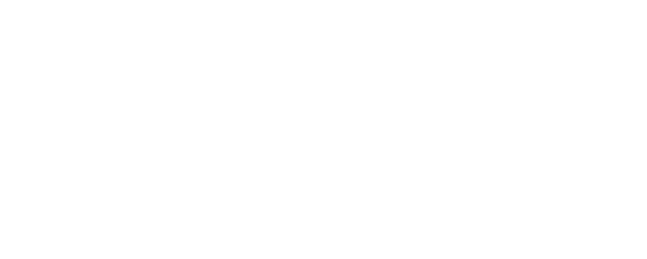

beep


<IPython.core.display.Javascript object>


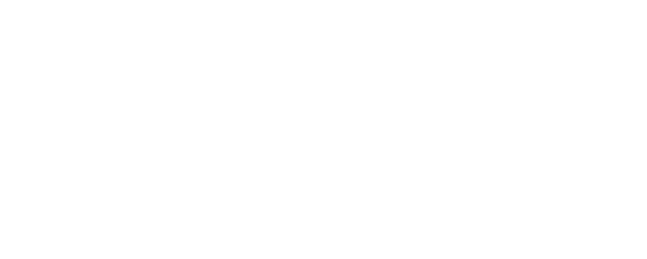

beep


<IPython.core.display.Javascript object>


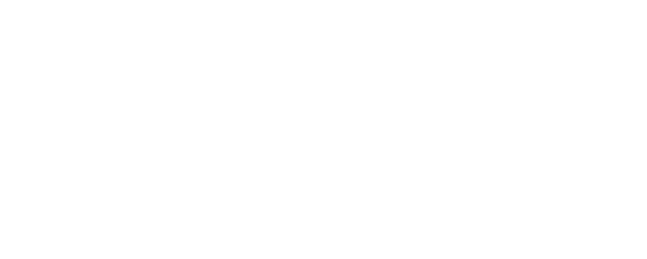

beep


<IPython.core.display.Javascript object>


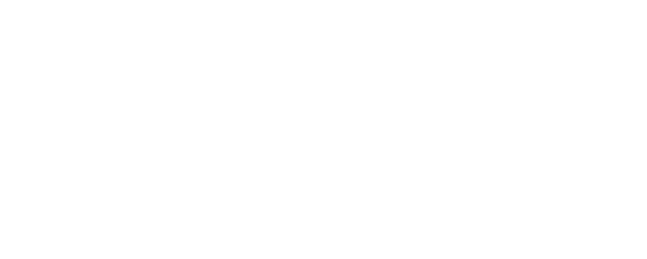

beep


<IPython.core.display.Javascript object>


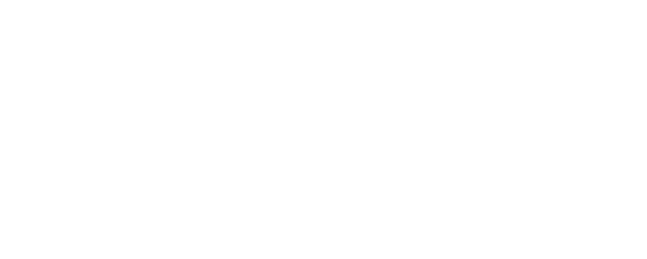

beep


<IPython.core.display.Javascript object>


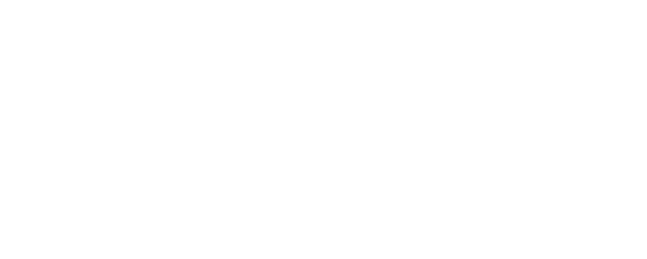

beep


<IPython.core.display.Javascript object>


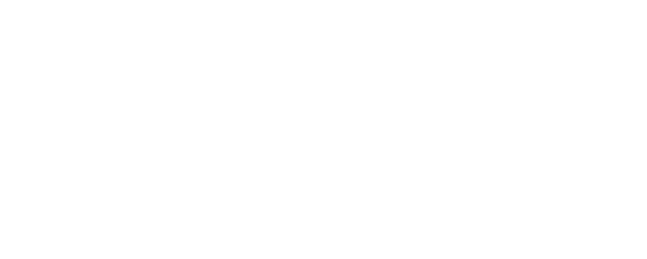

beep


<IPython.core.display.Javascript object>


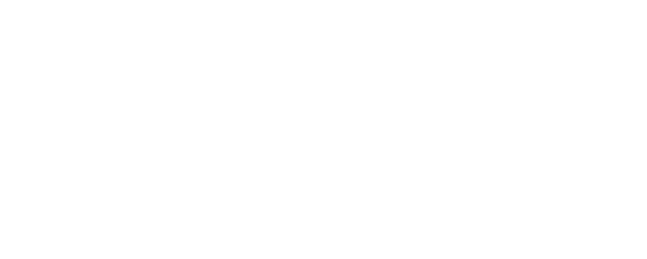

beep


<IPython.core.display.Javascript object>


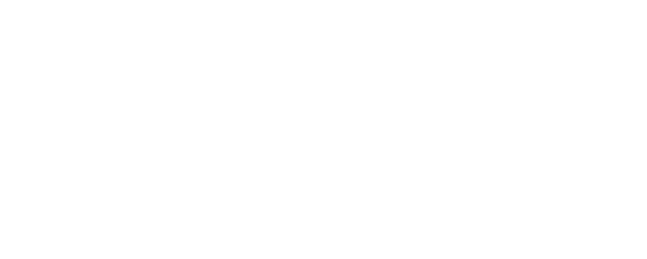

beep


<IPython.core.display.Javascript object>


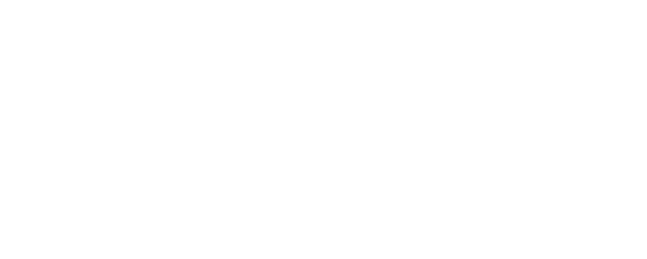

beep


<IPython.core.display.Javascript object>


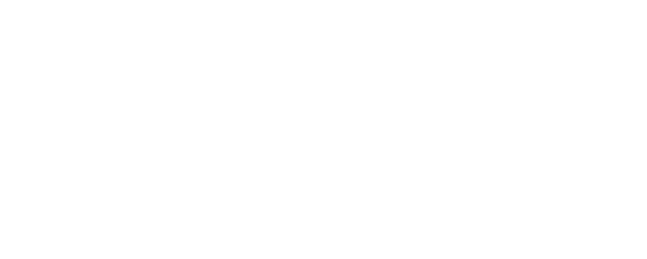

beep


<IPython.core.display.Javascript object>


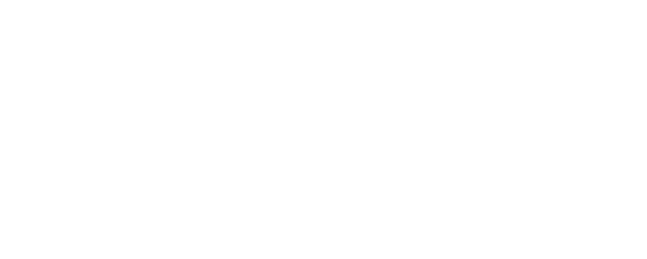

beep


<IPython.core.display.Javascript object>


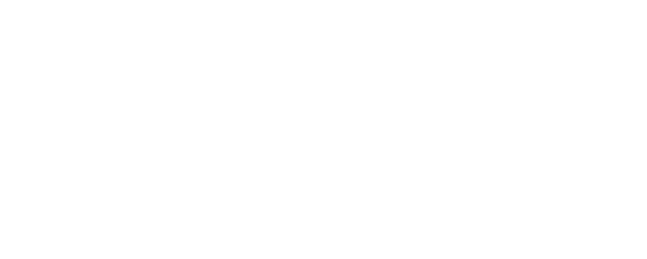

beep


<IPython.core.display.Javascript object>


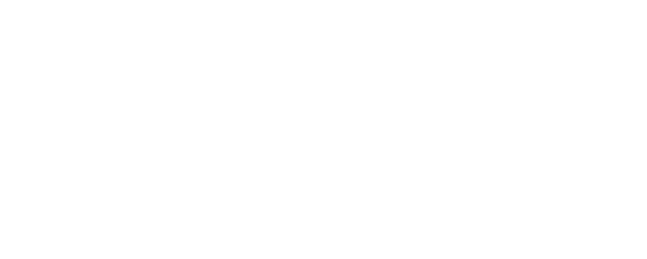

beep


<IPython.core.display.Javascript object>


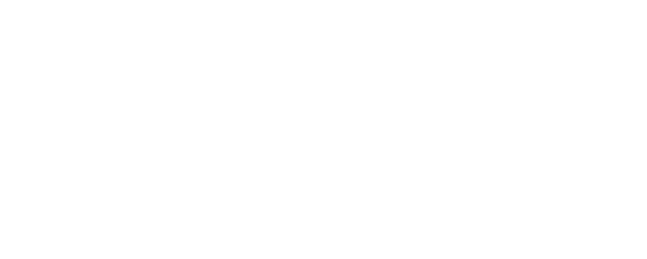

beep


<IPython.core.display.Javascript object>


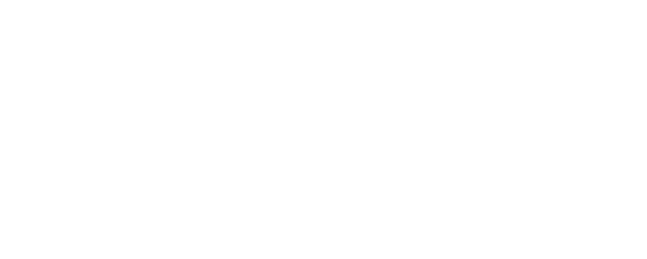

beep


<IPython.core.display.Javascript object>


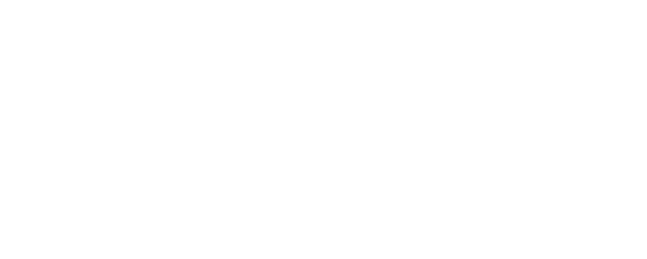

beep


<IPython.core.display.Javascript object>


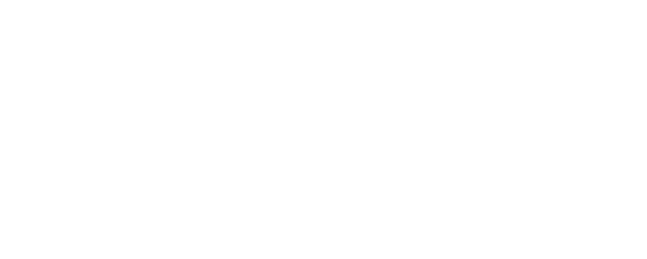

beep


<IPython.core.display.Javascript object>


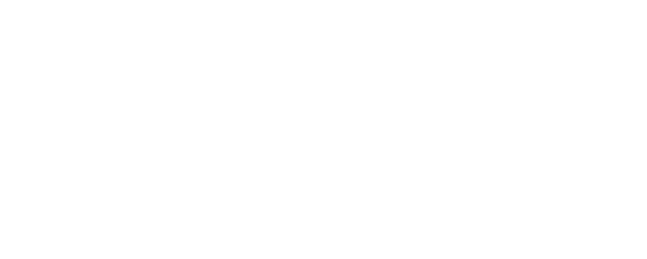

beep


<IPython.core.display.Javascript object>


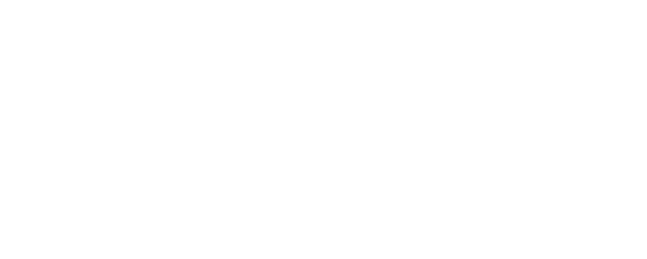

beep


<IPython.core.display.Javascript object>


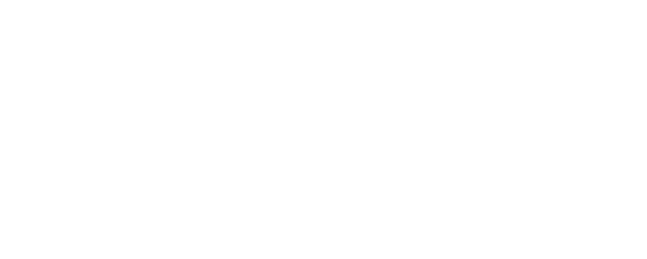

beep


<IPython.core.display.Javascript object>


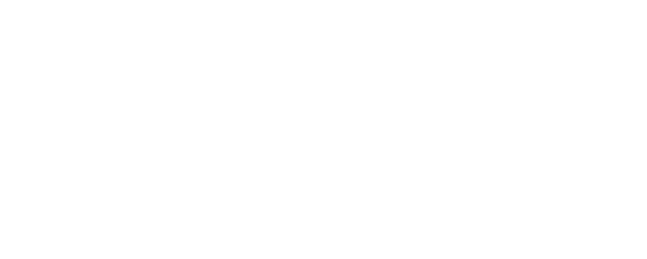

beep


<IPython.core.display.Javascript object>


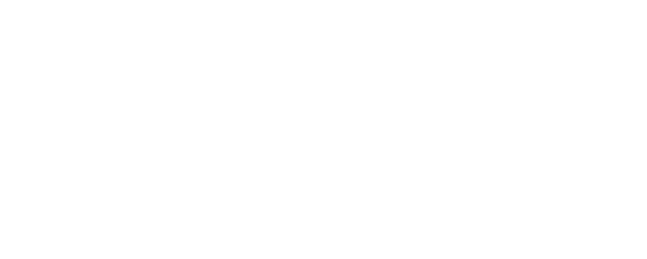

beep


<IPython.core.display.Javascript object>


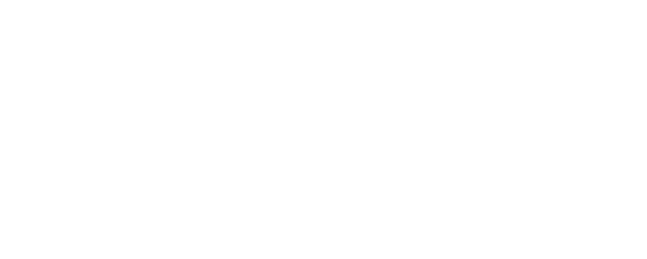

beep


<IPython.core.display.Javascript object>


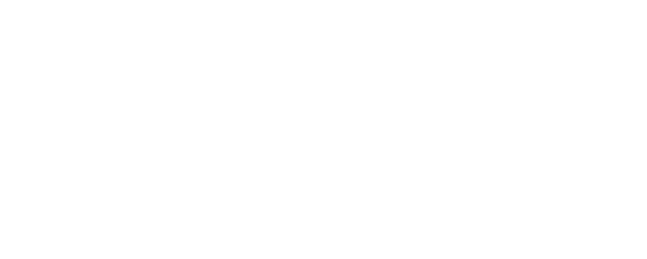

beep


<IPython.core.display.Javascript object>


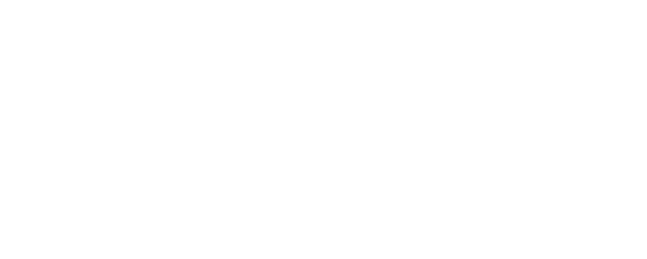

beep


<IPython.core.display.Javascript object>


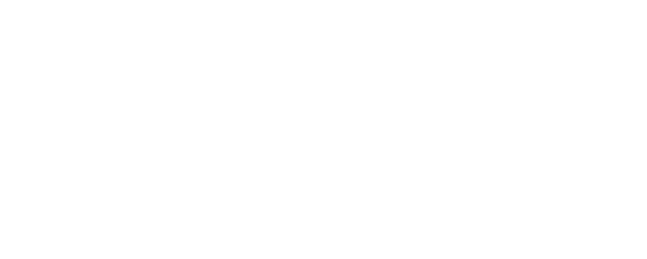

beep


<IPython.core.display.Javascript object>


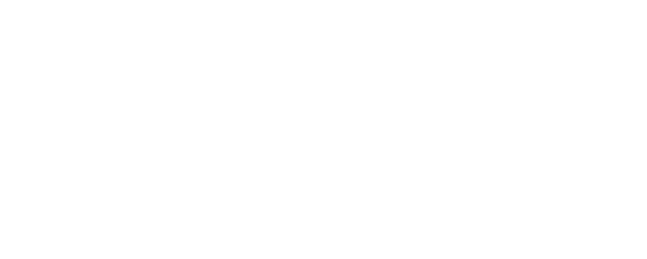

beep


<IPython.core.display.Javascript object>


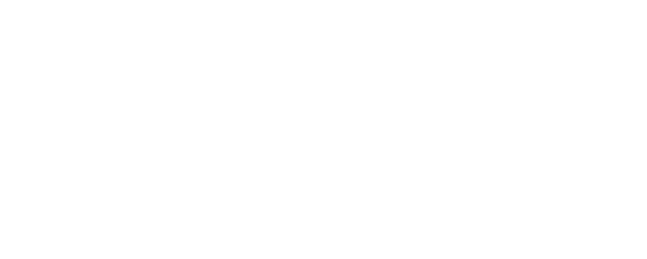

beep


<IPython.core.display.Javascript object>


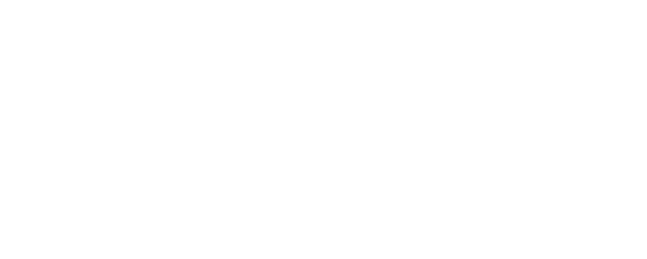

beep


<IPython.core.display.Javascript object>


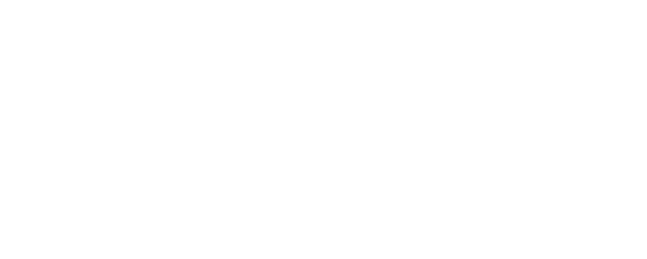

beep


<IPython.core.display.Javascript object>


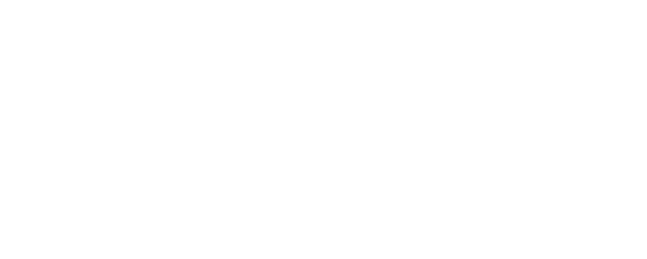

beep


<IPython.core.display.Javascript object>


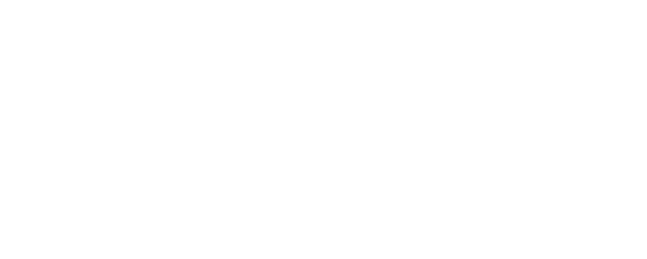

beep


<IPython.core.display.Javascript object>


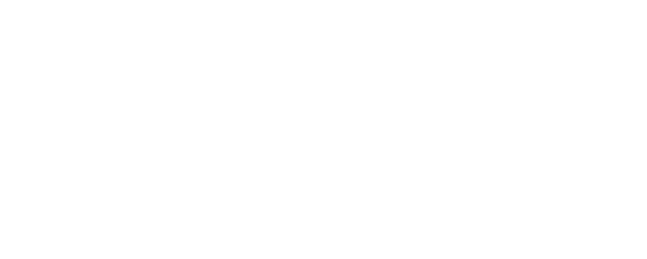

beep


<IPython.core.display.Javascript object>


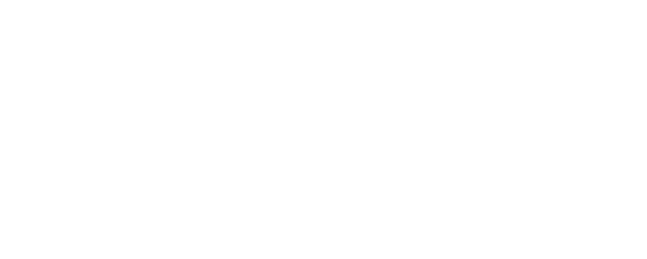

beep


<IPython.core.display.Javascript object>


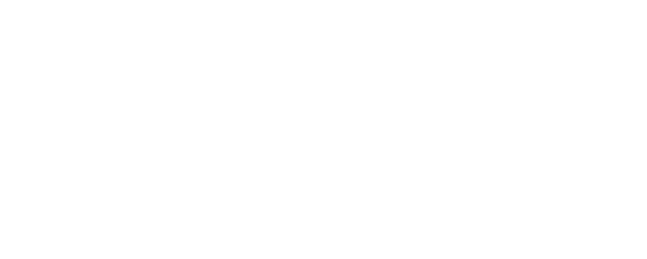

beep


<IPython.core.display.Javascript object>


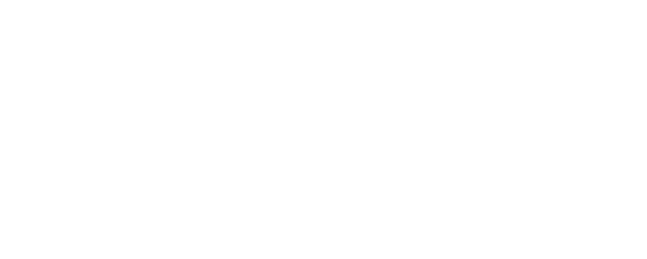

beep


<IPython.core.display.Javascript object>


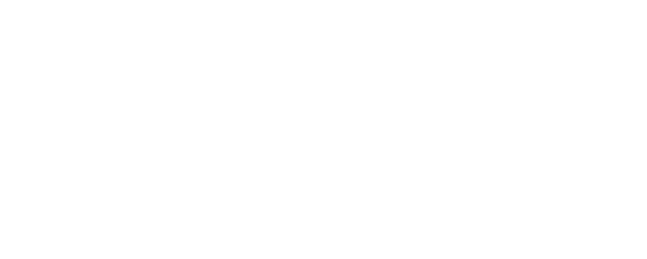

beep


<IPython.core.display.Javascript object>


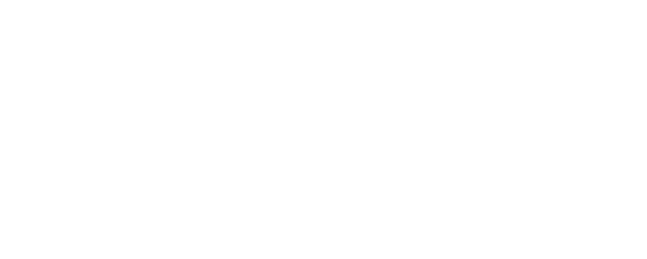

beep


<IPython.core.display.Javascript object>


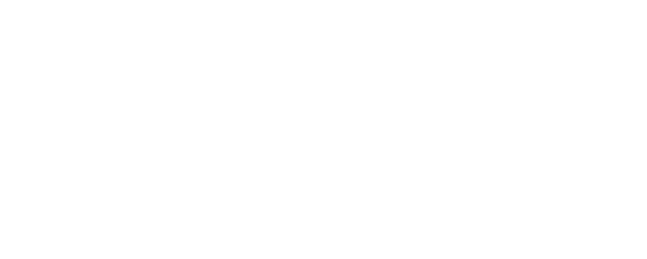

beep


<IPython.core.display.Javascript object>


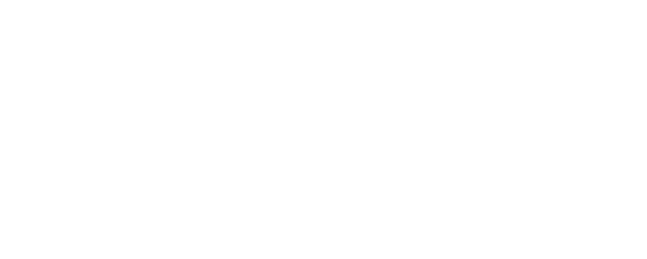

beep


<IPython.core.display.Javascript object>


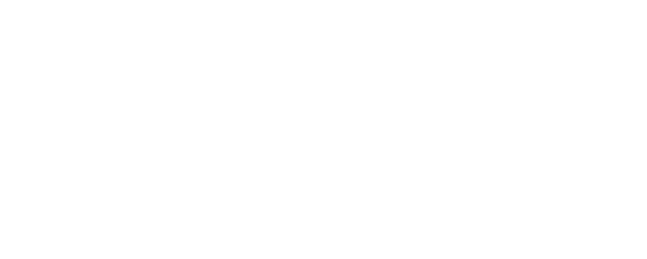

beep


<IPython.core.display.Javascript object>


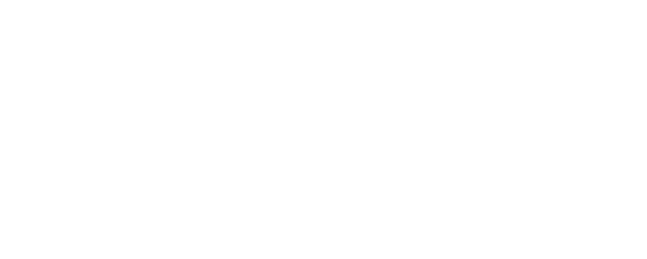

beep


<IPython.core.display.Javascript object>


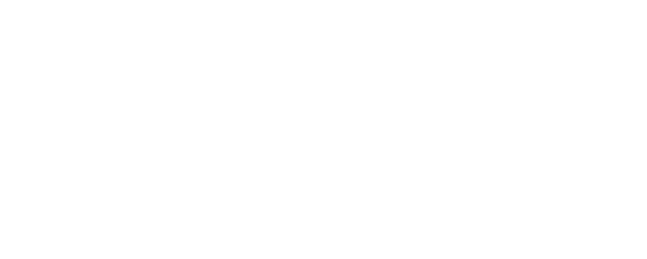

beep


<IPython.core.display.Javascript object>


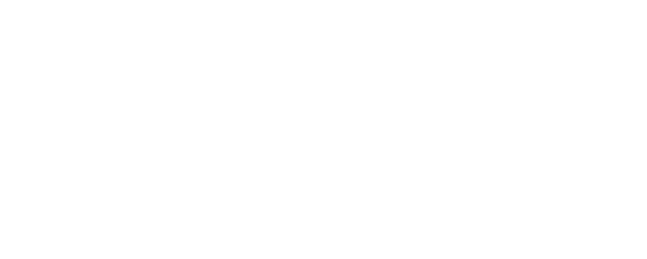

beep


<IPython.core.display.Javascript object>


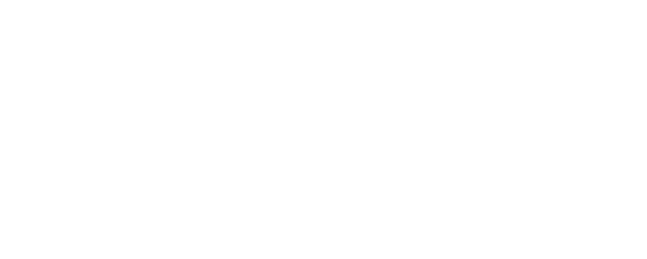

beep


<IPython.core.display.Javascript object>


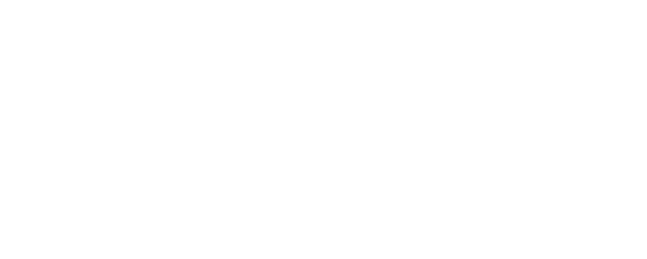

beep


<IPython.core.display.Javascript object>


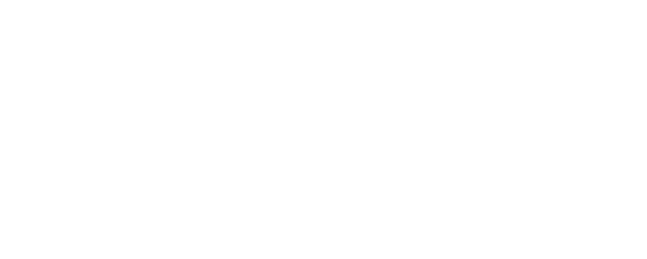

beep


<IPython.core.display.Javascript object>


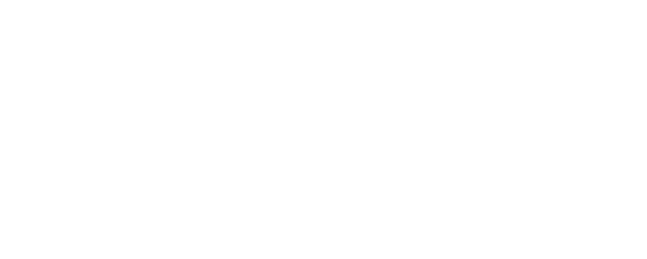

beep


<IPython.core.display.Javascript object>


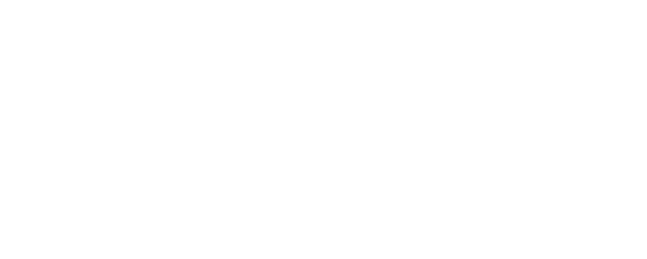

beep


<IPython.core.display.Javascript object>


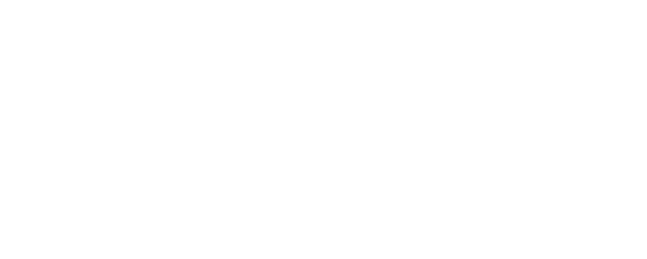

beep


<IPython.core.display.Javascript object>


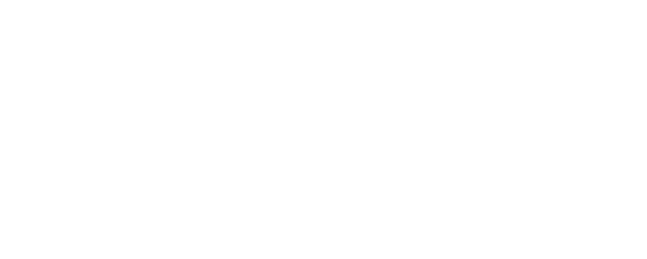

beep


<IPython.core.display.Javascript object>


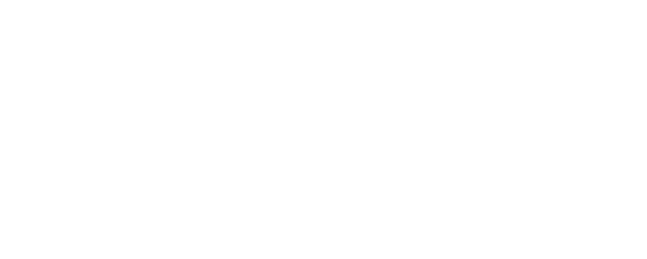

beep


<IPython.core.display.Javascript object>


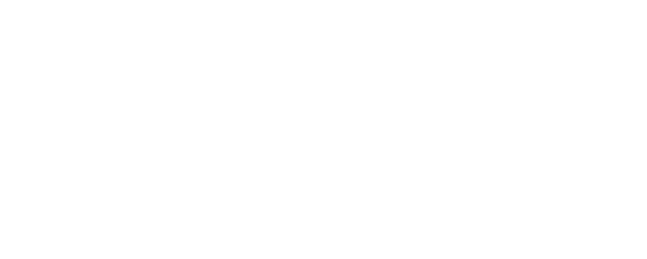

beep


<IPython.core.display.Javascript object>


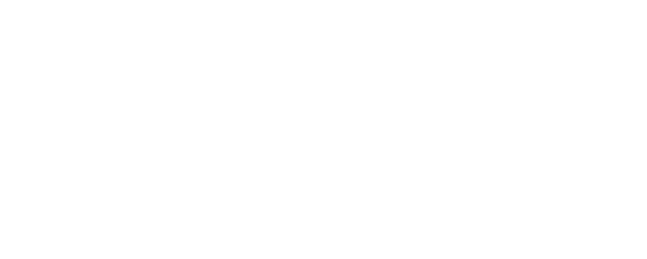

beep


<IPython.core.display.Javascript object>


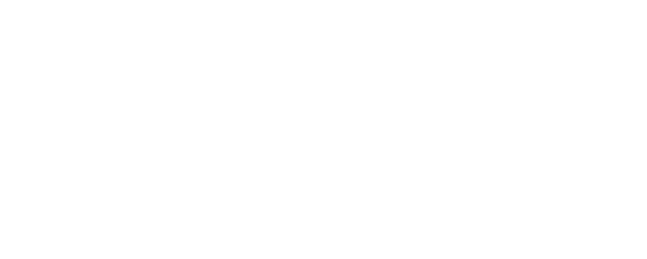

beep


<IPython.core.display.Javascript object>


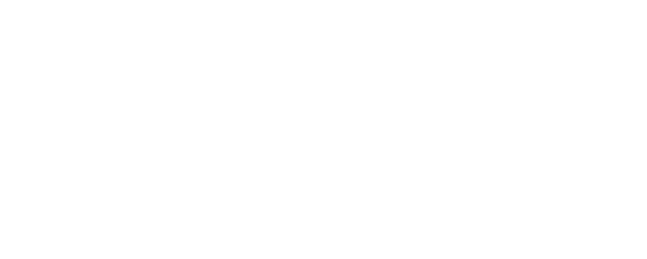

beep


<IPython.core.display.Javascript object>


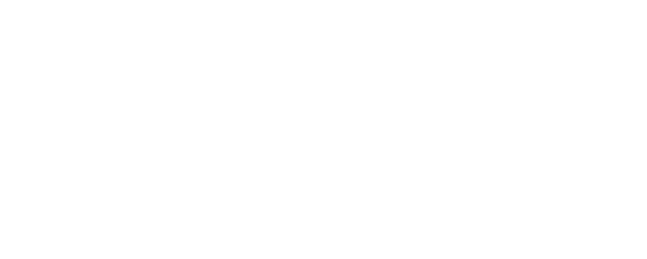

beep


<IPython.core.display.Javascript object>


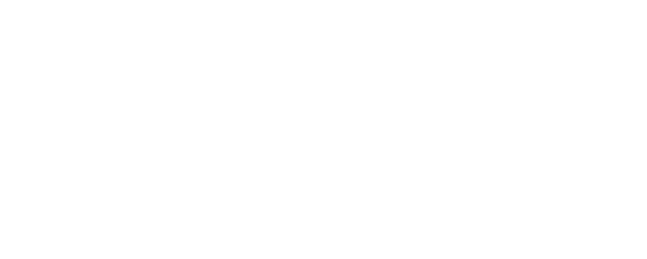

beep


<IPython.core.display.Javascript object>


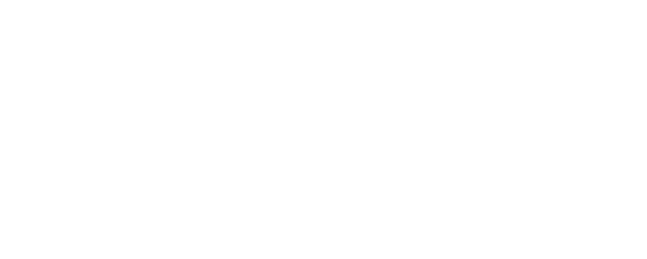

beep


<IPython.core.display.Javascript object>


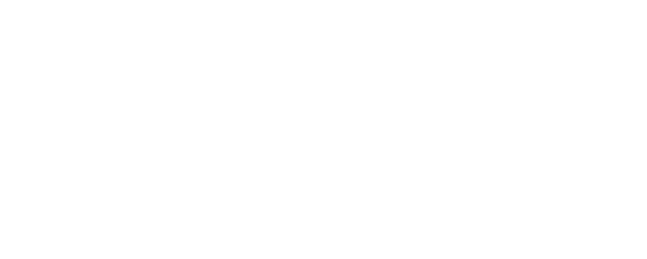

beep


<IPython.core.display.Javascript object>


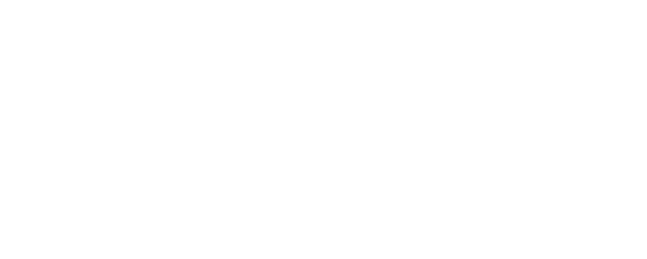

beep


<IPython.core.display.Javascript object>


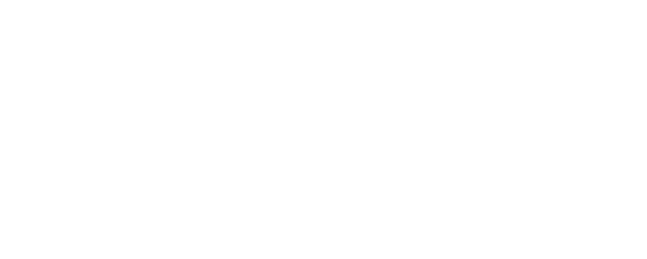

beep


<IPython.core.display.Javascript object>


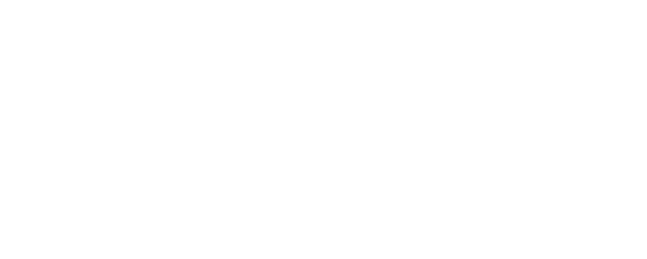

beep


<IPython.core.display.Javascript object>


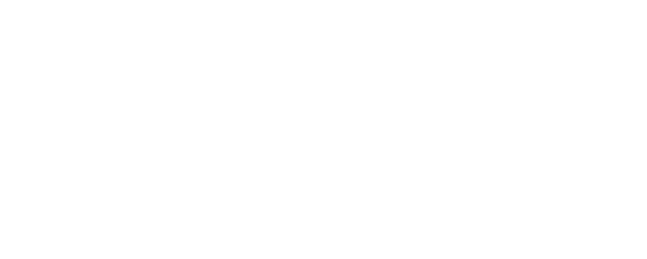

beep


<IPython.core.display.Javascript object>


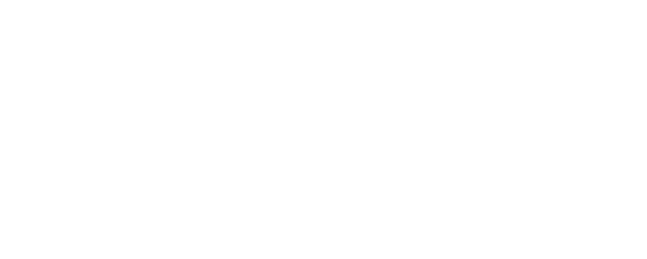

beep


<IPython.core.display.Javascript object>


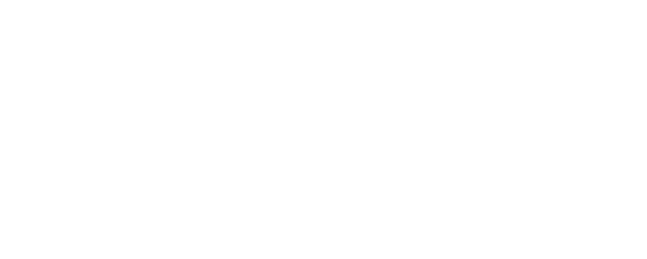

beep


<IPython.core.display.Javascript object>


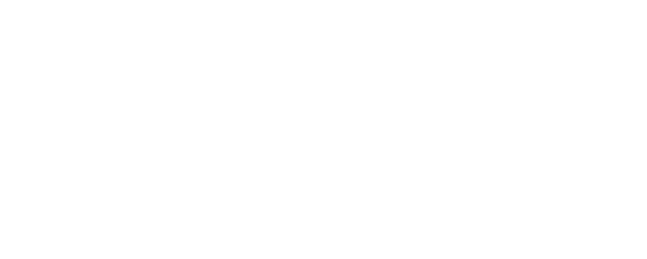

beep


<IPython.core.display.Javascript object>


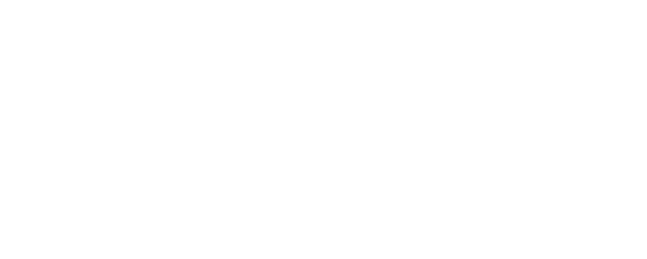

beep


<IPython.core.display.Javascript object>


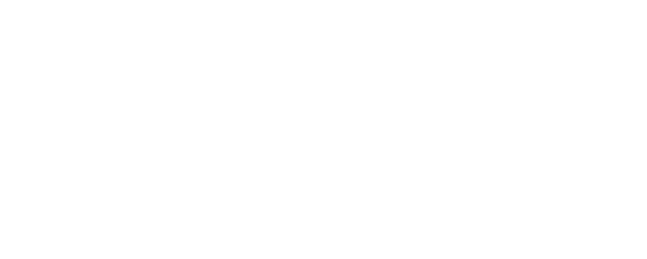

beep


<IPython.core.display.Javascript object>


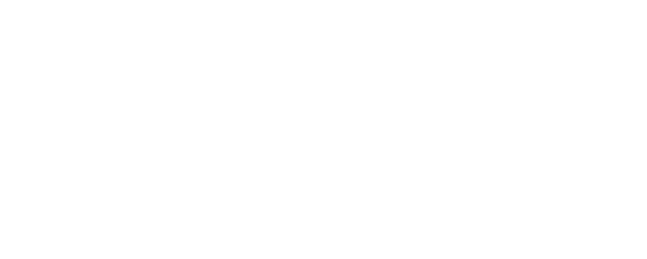

beep


<IPython.core.display.Javascript object>


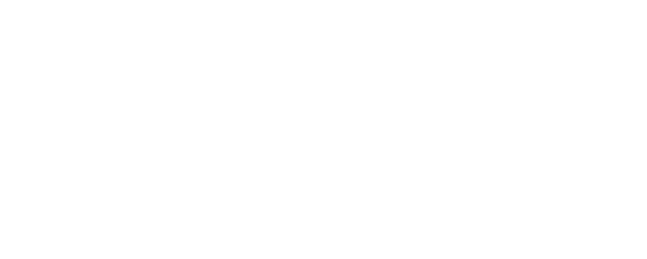

beep


<IPython.core.display.Javascript object>


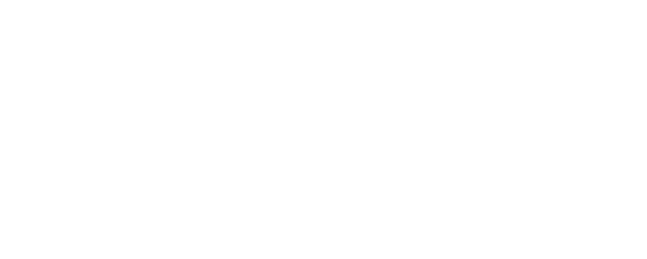

beep


<IPython.core.display.Javascript object>


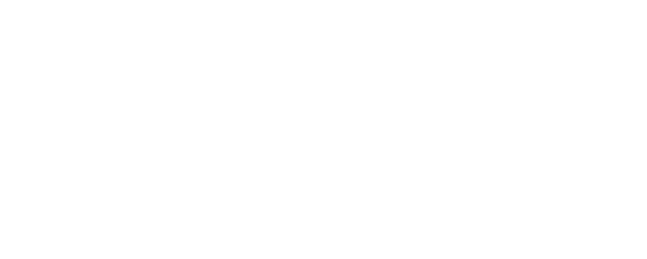

beep


<IPython.core.display.Javascript object>


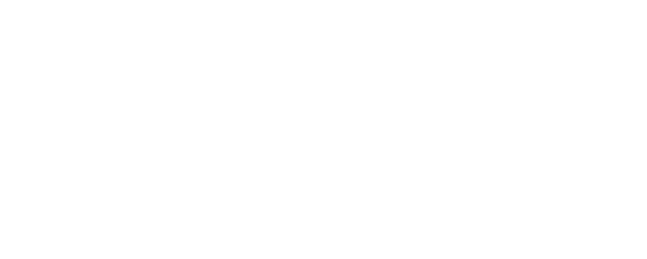

beep


256

In [143]:
Save_space(save+'/wanderer/frames/')
frames = np.arange(360,580)

for i in range(len(frames)):
    plttpf(frames[i])
    print('beep')
framerate = (575-360)/10
ffmpegcall = 'ffmpeg -y -f image2 -framerate ' + str(framerate) + ' -i ' + '/Users/ryanr/Documents/PhD/coding/Kepler/K2/wanderer/' +  'Frame_%04d.png -vcodec libx264 -pix_fmt yuv420p ' + save+'/wanderer/' + pixelfile.split('/')[-1].split('-')[0] + '_' + 'wander' + '.mp4'
os.system(ffmpegcall)

## Finding the coordinates 

Set of prerecorded positions

In [146]:
frames = np.array([366,369,373,379,382,444,452,458,467,473,481,490,498,517,528,535,545,553,560,566,571])
xpos = np.array([15,14,13,12,11,3,2,2,2,2,2,2,2,3,4,5,6,7,8,9,10])
ypos = np.array([9,9,9,9,9,7,7,7,7,6,6,5,5,4,4,3,3,2,0,0,0])

In [147]:
position = np.zeros((len(frames),2))
LC = np.zeros((len(frames)))
for i in range(len(frames)):
    newmask = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
    newmask[ypos[i],xpos[i]] = 1
    surround = convolve(newmask, np.ones((3,3)), mode='constant', cval=0.0) - newmask
    total = np.nansum(datacube[frames[i],(newmask+surround)==1])
    perc = datacube[frames[i],(newmask+surround)==1]/total
    #print(perc)
    unit = np.where((surround+newmask) == 1)
    unit = np.array(unit)
    unit[0] = unit[0] - xpos[i]
    unit[1] = unit[1] - ypos[i]
    xdisp = 0
    ydisp = 0
    for j in range(len(unit[0])):
        xdisp += unit[0][j]*perc[j]
        ydisp += unit[1][j]*perc[j]
    #print(xdisp,ydisp)
    astpos = [xpos[i]+xdisp,ypos[i]+ydisp]
    position[i,:] = astpos
    #Lightcurve of frame

    for i in range(len(frames)):
        print(i)
        LC[i] = np.nansum(datacube[frames[i]]*(newmask+surround),axis=(0,1))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18

In [148]:
LC

array([ 162.94641209,  157.38387513,  152.24268529,  149.03955841,
        151.56825638,  125.91509952,  109.69081151,  154.24479294,
        125.05329467,  112.6507857 ,  162.89861298,  144.85237968,
        124.49527658,  134.21201026,  173.46824431,  153.74080861,
        139.02057064,  113.2926023 ,   89.87955618,  131.85894132,
        122.74438179])

There is a position array with the pixel position. Now to convert it to RA and Dec:

In [149]:
realcoord = np.zeros((len(frames),2))
for i in range(len(position)):
    realcoord[i] = pix2coord(position[i,1],position[i,0],mywcs)

In [150]:
realcoord

array([[ 168.27097718,    4.2637676 ],
       [ 168.27125474,    4.26279429],
       [ 168.26996421,    4.26309169],
       [ 168.27067828,    4.25956464],
       [ 168.26995282,    4.25864668],
       [ 168.26687373,    4.25185296],
       [ 168.26795648,    4.25088385],
       [ 168.26696423,    4.24932803],
       [ 168.26641548,    4.25014707],
       [ 168.26525022,    4.25044252],
       [ 168.26537821,    4.24899628],
       [ 168.26533569,    4.24943859],
       [ 168.26512594,    4.24893548],
       [ 168.263309  ,    4.25289328],
       [ 168.26431565,    4.25239687],
       [ 168.2645402 ,    4.254551  ],
       [ 168.26431128,    4.25562625],
       [ 168.26304609,    4.25686549],
       [ 168.26079796,    4.25841815],
       [ 168.26094295,    4.25915606],
       [ 168.26089088,    4.25922493]])

## Plotting the motion 

In [151]:
import matplotlib.cm as cm

In [152]:
LC

array([ 162.94641209,  157.38387513,  152.24268529,  149.03955841,
        151.56825638,  125.91509952,  109.69081151,  154.24479294,
        125.05329467,  112.6507857 ,  162.89861298,  144.85237968,
        124.49527658,  134.21201026,  173.46824431,  153.74080861,
        139.02057064,  113.2926023 ,   89.87955618,  131.85894132,
        122.74438179])

<IPython.core.display.Javascript object>


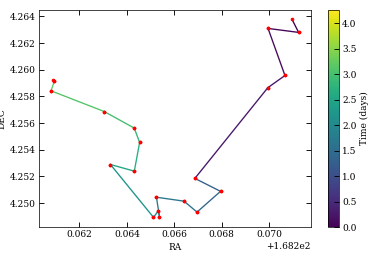

In [153]:
fig = plt.figure()
c = cm.viridis((frames-frames[0]))

hack = np.zeros((2,2))
im = plt.imshow(hack,vmin=0,vmax=(frames[-1]-frames[0])/48,cmap='viridis')
plt.clf()

for i in np.arange(len(realcoord[:,0])-1):
    plt.plot([realcoord[i,0],realcoord[i+1,0]], [realcoord[i,1],realcoord[i+1,1]], c=c[i])
    plt.plot([realcoord[i,0],realcoord[i+1,0]], [realcoord[i,1],realcoord[i+1,1]],'r.')

col = plt.colorbar(im)
col.set_label('Time (days)')
plt.xlim()
plt.tight_layout()
plt.ylabel('DEC')
plt.xlabel('RA')

<IPython.core.display.Javascript object>


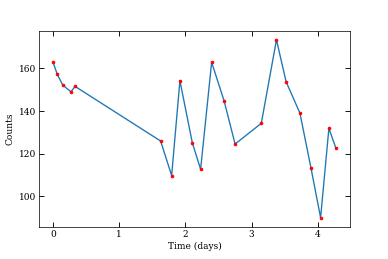

In [132]:
plt.figure()
plt.plot((frames-frames[0])/48,LC)
plt.plot((frames-frames[0])/48,LC,'r.')
plt.ylabel('Counts')
plt.xlabel('Time (days)')


In [162]:
datacube.shape

(4022, 16, 16)

In [167]:
corners = np.zeros((4,2))
pairs = np.array([[0,0],[15,0],[15,15],[0,15]])
for i in range(4):
    corners[i] = pix2coord(pairs[i,0],pairs[i,1],mywcs)

In [168]:
corners

array([[ 168.25906122,    4.24904889],
       [ 168.26166435,    4.26540901],
       [ 168.27806601,    4.26280048],
       [ 168.27546254,    4.24644041]])

In [172]:
wanderthruster = thrusters[(frames[0]<= thrusters) & (frames[-1]>= thrusters)]
wanderthruster

array([381, 405, 453, 477, 478, 501, 525, 561])

In [205]:
spacing = np.arange(0,frames[-1]-frames[0])
srealcoord = np.zeros((len(spacing),2))
for i in range(2):
    func = interp1d((frames-frames[0]), realcoord[:,i], kind='linear')
    srealcoord[:,i] = func(spacing)


<IPython.core.display.Javascript object>


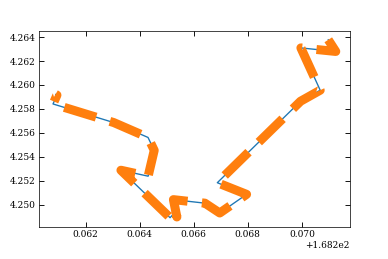

In [206]:
plt.figure()
plt.plot(srealcoord[:,0],srealcoord[:,1])
plt.plot(realcoord[:,0],realcoord[:,1],'--',lw=10)

<IPython.core.display.Javascript object>


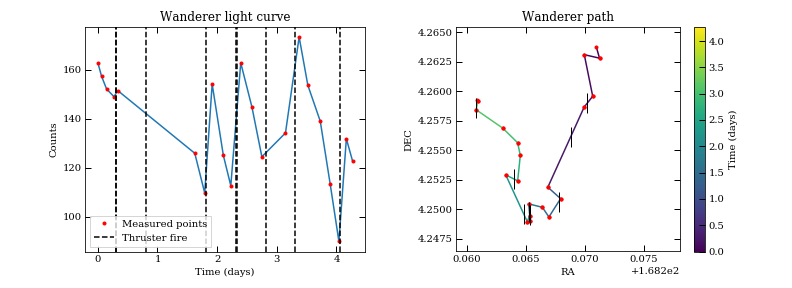

In [378]:
fig, (ax1,ax2) = plt.subplots(1,2)

hack = np.zeros((2,2))
im = plt.imshow(hack,vmin=0,vmax=(frames[-1]-frames[0])/48,cmap='viridis')
plt.cla()

ax1.plot((frames-frames[0])/48,LC)
ax1.plot((frames-frames[0])/48,LC,'r.',label='Measured points')
ax1.axvline((wanderthruster[0]-frames[0])/48,ls='--',color='black',label='Thruster fire')
for t in wanderthruster:
    ax1.axvline((t-frames[0])/48,ls='--',color='black')
ax1.set_ylabel('Counts')
ax1.set_xlabel('Time (days)')
ax1.set_title('Wanderer light curve')
ax1.legend()
# ax2
c = cm.viridis((frames-frames[0]))
for i in np.arange(len(realcoord[:,0])-1):
    ax2.plot([realcoord[i,0],realcoord[i+1,0]], [realcoord[i,1],realcoord[i+1,1]], c=c[i])
    ax2.plot([realcoord[i,0],realcoord[i+1,0]], [realcoord[i,1],realcoord[i+1,1]],'r.')

ax2.plot(srealcoord[wanderthruster-frames[0],0],srealcoord[wanderthruster-frames[0],1],'k|',ms=20)

ax2.invert_yaxis()
col = plt.colorbar(im)
col.set_label('Time (days)')
plt.xlim()
plt.tight_layout()
plt.ylabel('DEC')
plt.ylim(min(corners[:,1]),max(corners[:,1]))
plt.xlabel('RA')
plt.xlim(min(corners[:,0]),max(corners[:,0]))
plt.title('Wanderer path')
fig.set_size_inches((11,4))
plt.savefig(save+'/wanderer/LC_path.pdf')

## Formatting date and time

In [227]:
from astropy.time import Time

In [321]:
test = Time(time[spacing+frames[0]],format='jd')
bleep = test.datetime

formattime=[]
for i in range(len(bleep)):
    formattime.append(bleep[i].strftime("%Y %m %d") + '.' + str(format(int(bleep[i].strftime("%H"))/24+int(bleep[i].strftime("%M"))/(24*60)+int(bleep[i].strftime("%S"))/(24*60**2),'.5f').split('.')[-1]))          

In [322]:
formattime

['2014 06 07.15608',
 '2014 06 07.17650',
 '2014 06 07.19693',
 '2014 06 07.21736',
 '2014 06 07.23780',
 '2014 06 07.25823',
 '2014 06 07.27866',
 '2014 06 07.29910',
 '2014 06 07.31953',
 '2014 06 07.33995',
 '2014 06 07.36039',
 '2014 06 07.38082',
 '2014 06 07.40125',
 '2014 06 07.42169',
 '2014 06 07.44212',
 '2014 06 07.46255',
 '2014 06 07.48299',
 '2014 06 07.50341',
 '2014 06 07.52384',
 '2014 06 07.54428',
 '2014 06 07.56471',
 '2014 06 07.58514',
 '2014 06 07.60558',
 '2014 06 07.62601',
 '2014 06 07.64644',
 '2014 06 07.66687',
 '2014 06 07.68730',
 '2014 06 07.70773',
 '2014 06 07.72817',
 '2014 06 07.74860',
 '2014 06 07.76903',
 '2014 06 07.78947',
 '2014 06 07.80990',
 '2014 06 07.83032',
 '2014 06 07.85076',
 '2014 06 07.87119',
 '2014 06 07.89162',
 '2014 06 07.91206',
 '2014 06 07.93249',
 '2014 06 07.95292',
 '2014 06 07.97336',
 '2014 06 07.99378',
 '2014 06 08.01421',
 '2014 06 08.03465',
 '2014 06 08.05508',
 '2014 06 08.07551',
 '2014 06 08.09594',
 '2014 06 08.

## Formating coordinates to the type needed

In [337]:
def Deg(deg):
    if (deg < 10) & (deg > -10):
        if deg > 0:
            degstr = '+0'+str(deg)
        else:
            degstr = '-0'+str(deg)
    else:
        if deg > 0:
            degstr = '+'+str(deg)
        else:
            degstr = '-'+str(deg)
    return degstr
    
def Minutes(minutes):
    if (minutes < 10) & (minutes > -10):
        minstr = '0'+str(minutes)
    else:
        minstr = str(minutes)
    return minstr

def Seconds(sec):
    if (sec < 10) & (sec > -10):
        secstr = '0'+str(format(sec,'.2f'))
    else:
        secstr = str(format(sec,'.2f'))
    return secstr

In [338]:
c = SkyCoord(srealcoord[:,0], srealcoord[:,1], frame='icrs', unit='deg')
RA = []
DEC = []
for i in range(len(spacing)):
    RA.append(Minutes(int(c.ra.hms[0][i]))+' '+Minutes(int(c.ra.hms[1][i]))+' '+Seconds(c.ra.hms[2][i]))
    DEC.append(Deg(int(c.dec.dms[0][i]))+' '+Minutes(int(c.dec.dms[1][i]))+' '+Seconds(c.dec.dms[2][i]))
    

In [316]:
DEC

['+04 15 49.56',
 '+04 15 48.40',
 '+04 15 47.23',
 '+04 15 46.06',
 '+04 15 46.33',
 '+04 15 46.59',
 '+04 15 46.86',
 '+04 15 47.13',
 '+04 15 45.01',
 '+04 15 42.90',
 '+04 15 40.78',
 '+04 15 38.67',
 '+04 15 36.55',
 '+04 15 34.43',
 '+04 15 33.33',
 '+04 15 32.23',
 '+04 15 31.13',
 '+04 15 30.73',
 '+04 15 30.34',
 '+04 15 29.94',
 '+04 15 29.55',
 '+04 15 29.16',
 '+04 15 28.76',
 '+04 15 28.37',
 '+04 15 27.97',
 '+04 15 27.58',
 '+04 15 27.18',
 '+04 15 26.79',
 '+04 15 26.39',
 '+04 15 26.00',
 '+04 15 25.61',
 '+04 15 25.21',
 '+04 15 24.82',
 '+04 15 24.42',
 '+04 15 24.03',
 '+04 15 23.63',
 '+04 15 23.24',
 '+04 15 22.84',
 '+04 15 22.45',
 '+04 15 22.06',
 '+04 15 21.66',
 '+04 15 21.27',
 '+04 15 20.87',
 '+04 15 20.48',
 '+04 15 20.08',
 '+04 15 19.69',
 '+04 15 19.29',
 '+04 15 18.90',
 '+04 15 18.50',
 '+04 15 18.11',
 '+04 15 17.72',
 '+04 15 17.32',
 '+04 15 16.93',
 '+04 15 16.53',
 '+04 15 16.14',
 '+04 15 15.74',
 '+04 15 15.35',
 '+04 15 14.95',
 '+04 15 14.56

## Saving out values to 80 column format

In [339]:
save

'/Users/ryanr/Documents/PhD/coding/Kepler/K2'

In [349]:
Path = '/Users/ryanr/Documents/PhD/coding/Kepler/Data/Wanderer/'

In [354]:
if ~os.path.isfile(Path + 'Orbit.txt'):
    with open(Path + 'Orbit.txt', 'w') as out:
        out.write('123456789|123456789|123456789|123456789|123456789|123456789|123456789|123456789|\n')
        out.write('<-ObjDesig->*nnYYYY MM DD.DDDDD HH MM SS.SSSsdd mm ss.ss<blanks >MM.MMBz<ref>COD\n')

for i in range(len(formattime)):
    namestr = '    '+'Wanderer'.ljust(11)
    datastr = (formattime[i]+' '+RA[i]+' '+DEC[i]).ljust(62)
    obsstr = 'C55'
    totalstr = namestr + datastr + obsstr+'\n'
    print(totalstr)
    with open(Path + 'Orbit.txt', 'a') as out:
        out.write(totalstr)


    Wanderer   2014 06 07.15608 11 13 05.03 +04 15 49.56                     C55

    Wanderer   2014 06 07.17650 11 13 05.06 +04 15 48.40                     C55

    Wanderer   2014 06 07.19693 11 13 05.08 +04 15 47.23                     C55

    Wanderer   2014 06 07.21736 11 13 05.10 +04 15 46.06                     C55

    Wanderer   2014 06 07.23780 11 13 05.02 +04 15 46.33                     C55

    Wanderer   2014 06 07.25823 11 13 04.95 +04 15 46.59                     C55

    Wanderer   2014 06 07.27866 11 13 04.87 +04 15 46.86                     C55

    Wanderer   2014 06 07.29910 11 13 04.79 +04 15 47.13                     C55

    Wanderer   2014 06 07.31953 11 13 04.82 +04 15 45.01                     C55

    Wanderer   2014 06 07.33995 11 13 04.85 +04 15 42.90                     C55

    Wanderer   2014 06 07.36039 11 13 04.88 +04 15 40.78                     C55

    Wanderer   2014 06 07.38082 11 13 04.91 +04 15 38.67                     C55

    Wanderer   2

In [342]:
'Wanderer'.ljust(15)

'Wanderer       '

In [343]:
(formattime[0]+' '+RA[0]+' '+DEC[0]).ljust(65)

'2014 06 07.15608 11 13 05.03 +04 15 49.56                        '

In [ ]:
total = np.nansum(Maskdata[Mid[0][0]+eventtime[0,0],(newmask+surround)==1])
perc = Maskdata[Mid[0][0]+eventtime[0,0],(newmask+surround)==1]/total
unit = np.where((surround+newmask) == 1)
unit = np.array(unit)
unit[0] = unit[0] - Mid[1]
unit[1] = unit[1] - Mid[2]
xdisp = 0
ydisp = 0
for i in range(len(unit[0])):
    xdisp += unit[0][i]*perc[i]
    ydisp += unit[1][i]*perc[i]
print(xdisp,ydisp)
astpos = [Mid[1][0]+xdisp,Mid[2][0]+ydisp]

In [ ]:
newmask = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
newmask[Mid[1],Mid[2]] = 1
surround = convolve(newmask, np.ones((3,3)), mode='constant', cval=0.0) - newmask
pixpos = np.where(surround == 1)
plt.figure()
plt.plot(np.nansum(newmask*Maskdata,axis=(1,2)),'.',label='Central '+ str(Mid[1][0])+','+str(Mid[2][0]))
for i in range(int(np.nansum(surround))):
    plt.plot(Maskdata[:,pixpos[0][i],pixpos[1][i]], '.',label=str(pixpos[0][i])+','+str(pixpos[1][i]))
plt.xlim(360, 370)
plt.legend()
    

In [357]:
hdu.info()

Filename: /Users/ryanr/Documents/PhD/coding/Kepler/Data/ktwo201736342-c01_lpd-targ.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   ()      
  1  TARGETTABLES    1 BinTableHDU    282   4022R x 13C   ['D', 'E', 'J', '256J', '256E', '256E', '256E', '256E', '256E', 'J', 'E', 'E', '0E']   
  2  APERTURE      1 ImageHDU        48   (16, 16)   int32   


In [364]:
hdu[1].header

XTENSION= 'BINTABLE'           / marks the beginning of a new HDU               
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 6172 / length of first array dimension                
NAXIS2  =                 4022 / length of second array dimension               
PCOUNT  =                    0 / group parameter count (not used)               
GCOUNT  =                    1 / group count (not used)                         
TFIELDS =                   13 / number of table fields                         
TTYPE1  = 'TIME    '           / column title: data time stamps                 
TFORM1  = 'D       '           / column format: 64-bit floating point           
TUNIT1  = 'BJD - 2454833'      / column units: barycenter corrected JD          
TDISP1  = 'D14.7   '           / column display format                          
TTYPE2  = 'TIMECORR'        

In [377]:
hdu[1].header

XTENSION= 'BINTABLE'           / marks the beginning of a new HDU               
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 6172 / length of first array dimension                
NAXIS2  =                 4022 / length of second array dimension               
PCOUNT  =                    0 / group parameter count (not used)               
GCOUNT  =                    1 / group count (not used)                         
TFIELDS =                   13 / number of table fields                         
TTYPE1  = 'TIME    '           / column title: data time stamps                 
TFORM1  = 'D       '           / column format: 64-bit floating point           
TUNIT1  = 'BJD - 2454833'      / column units: barycenter corrected JD          
TDISP1  = 'D14.7   '           / column display format                          
TTYPE2  = 'TIMECORR'        